# ami-optim

## Optimization of Ajusted Mutual Information between high-dim and low-dim clusterings

In this Notebook, we perform optimization experiments on 6 datasets aiming to find the set of hiperparameters that allow for the highest Ajusted Mutual Information between high-dimensional and low-dimensional clusterings.

## Tools & Libraries

We use **`Python`**. The following modules are used:

* **pandas:** reading, writing and manipulating data.
* **numpy:** vectorized calculations and other relevant math functions.
* **scipy:** functions for scientific purposes. Great statistics content.
* **matplotlib & seaborn:** data visualization.
* **sklearn:** comprehensive machine learning libraries.
* **hyperopt:** random search and TPE for hyperparameter optimization.
* **BayesianOptimization:** Gaussian Processes.

In [1]:
# opening up a console as the notebook starts
%qtconsole

# making plots stay on the notebook (no extra windows!)
%matplotlib inline

# show figures with highest resolution 
%config InlineBackend.figure_format = 'retina'

# changing working directory
import os
os.chdir('C:\\Users\\Guilherme\\Documents\\TCC\\tsne-optim')

# importing modules
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import png, array
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from bayes_opt import BayesianOptimization
from hyperopt import fmin, rand, tpe, hp, STATUS_OK, Trials
from hdbscan import HDBSCAN
from sklearn.metrics import adjusted_mutual_info_score
from scipy.stats import spearmanr
from sklearn.metrics.pairwise import euclidean_distances

## 1. Search spaces

Let us define our hyperparameter search space, both for **`hyperopt`** and **`BayesianOptimization`**. Furthermore, we also define a **baseline** set of parameters, used by Maaten et. al. in the [2008 paper](http://www.jmlr.org/papers/volume9/vandermaaten08a/vandermaaten08a.pdf) that first proposed t-SNE.

In [2]:
# search space definition - hyperopt #

space_hp = {'perplexity': hp.quniform('perp', 2, 200, 1),
            'early_exaggeration': hp.uniform('exag', 1.0, 12.0),
            'learning_rate': hp.uniform('lr', 50, 1000),
            'n_iter': hp.quniform('ni', 200, 5000, 100),
            'angle': hp.uniform('angle', 0.2, 0.8),
            'pca_dims': hp.quniform('pca', 10, 100, 5),
            'whitening_flag': hp.choice('white', [True, False])}

In [3]:
# search space definition - bayesian optimzation #

space_bo = {'perplexity': (2, 200),
            'early_exaggeration': (1.0, 12.0),
            'learning_rate': (50, 1000),
            'n_iter': (200, 5000),
            'angle': (0.2,0.8),
            'pca_dims': (10, 100),
            'whitening_flag': (0.0, 1.0)}

In [4]:
# set of hyperparameters definition - baseline #

space_base = {'perplexity': 30,
              'early_exaggeration': 4.0,
              'learning_rate': 100,
              'n_iter': 1000,
              'angle': 0.5,
              'pca_dims': 30,
              'whitening_flag': False}

## 2. Target function

Let us define our optimization objective. Here we run t-SNE.

In [5]:
# defining cost function: KL divergence #

# the function takes a search space sample as parameter #
def optim_target(data, perplexity, early_exaggeration, learning_rate, n_iter, angle, pca_dims, whitening_flag, n_runs=3):    
    
    # setting random seed
    np.random.seed(42)
    
    # store target info
    target_var = data['TARGET']; data = data.drop('TARGET', axis=1)
    
    # HDBSCAN to compute clusters on high dimensional space
    # HDBSCAN(min_cluster_size=10, min_samples=1, allow_single_cluster=True)
    clusterer_highd = HDBSCAN(min_cluster_size=10, min_samples=1, allow_single_cluster=True)

    # clustering points
    cluster_assign_highd = clusterer_highd.fit_predict(PCA(n_components=100).fit_transform(data))        
    
    # PCA first to reduce data
    reducer = PCA(n_components=pca_dims, whiten=whitening_flag)
    
    # reducing
    reduced_data = reducer.fit_transform(data)
    
    # let us run t-SNE 5 times and get the best KL div #
    
    # divergence accumulator, initialize with +infinity
    KL_div = np.inf
    
    # loop for each t-SNE run
    for i in range(n_runs):
        
        # configuring t-SNE
        embedder = TSNE(perplexity=perplexity, early_exaggeration=early_exaggeration,
                        learning_rate=learning_rate, n_iter=n_iter,
                        angle=angle, random_state=i)
        
        # fitting
        temp_data = embedder.fit_transform(reduced_data)
    
        # KL divergence result after optimization
        temp_div = embedder.kl_divergence_
        
        # if smaller than last experiment, update
        if temp_div < KL_div:
            
            # updating values
            KL_div = temp_div
            embedded_data = temp_data
    
    # data frame form embedded_data
    embedded_data = pd.DataFrame({'x': zip(*embedded_data)[0], 'y': zip(*embedded_data)[1]})
    
    # computing ajusted mutual information over clusterings #

    # HDBSCAN to compute clusters on embedded space
    clusterer_lowd = HDBSCAN(min_cluster_size=10, min_samples=1, allow_single_cluster=True)

    # clustering points - low-dim
    cluster_assign_lowd = clusterer_lowd.fit_predict(embedded_data)

    # ajusted mutual info score
    AMI_score = adjusted_mutual_info_score(cluster_assign_highd, cluster_assign_lowd)
    
    # ajusted mutual info on target and dimensions
    AMI_target_highd = adjusted_mutual_info_score(target_var, cluster_assign_highd)
    AMI_target_lowd = adjusted_mutual_info_score(target_var, cluster_assign_lowd)

    # computing global geometry #
    
    # treating empty centers errors
    try:
        # centers on high dimensional space
        data['assignment'] = cluster_assign_highd; c_groups = data.groupby('assignment').mean()
        centers_highd = [np.array(c_groups.iloc[i,:]) for i in c_groups.index if not i == -1]

        # distances on high dimensional space
        dists_highd = euclidean_distances(centers_highd)
        closest_highd = [np.argsort(dists_highd[:,i])[1:] for i in range(dists_highd.shape[0])]
        closest_highd_df = pd.DataFrame(np.matrix(closest_highd))

        # centers on low dimensional space
        embedded_data['assignment'] = cluster_assign_highd; c_groups = embedded_data.groupby('assignment').mean()
        centers_lowd = [np.array(c_groups.iloc[i,:]) for i in c_groups.index if not i == -1]

        # distances on high dimensional space
        dists_lowd = euclidean_distances(centers_lowd)
        closest_lowd = [np.argsort(dists_lowd[:,i])[1:] for i in range(dists_lowd.shape[0])]
        closest_lowd_df = pd.DataFrame(np.matrix(closest_lowd))

        # correlations
        rank_order_cor = [spearmanr(closest_lowd_df.iloc[i,:], closest_highd_df.iloc[i,:]).correlation for i in closest_lowd_df.index]
        rank_order_cor_score = np.mean(rank_order_cor)
        
        # if missing value, make it -1.0
        if pd.isnull(rank_order_cor_score):
            rank_order_cor_score = -1.0
        
    # lowest value for rank-order corr if error
    except ValueError:
        rank_order_cor_score = -1.0
    
    # organizing parameters to return
    params = {'perplexity': perplexity,
              'early_exaggeration': early_exaggeration,
              'learning_rate': learning_rate,
              'n_iter': n_iter,
              'angle': angle,
              'pca_dims': pca_dims,
              'whitening_flag': whitening_flag}
    
    # adding target variable to embedded data
    embedded_data.loc[:,'target'] = target_var
    
    # printing results
    print 'KL divergence:', KL_div, '| AMI score:', AMI_score
    print 'AMI target-highd:', AMI_target_highd, '| AMI target-lowd:', AMI_target_lowd
    print 'Rank-order correlation:', rank_order_cor_score
    print 'Parameters:', params
    print ' '

    # returning values
    return KL_div, AMI_score, AMI_target_highd, AMI_target_lowd, rank_order_cor_score, embedded_data, params

In [6]:
# testing the function #

# let us use coil-20 dataset on baseline parameters
test_df = pd.read_csv('data/final/coil-20.csv')

# removing target variable
test_target = test_df['TARGET']

# running target function
kl_div, ami, ami_th, ami_tl, spearman, embed, params = optim_target(test_df, n_runs=1, **space_base)

KL divergence: 1.8724489212 | AMI score: 0.613024245036
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.593382676379
Rank-order correlation: 0.0554985754986
Parameters: {'whitening_flag': False, 'n_iter': 1000, 'pca_dims': 30, 'angle': 0.5, 'learning_rate': 100, 'early_exaggeration': 4.0, 'perplexity': 30}
 


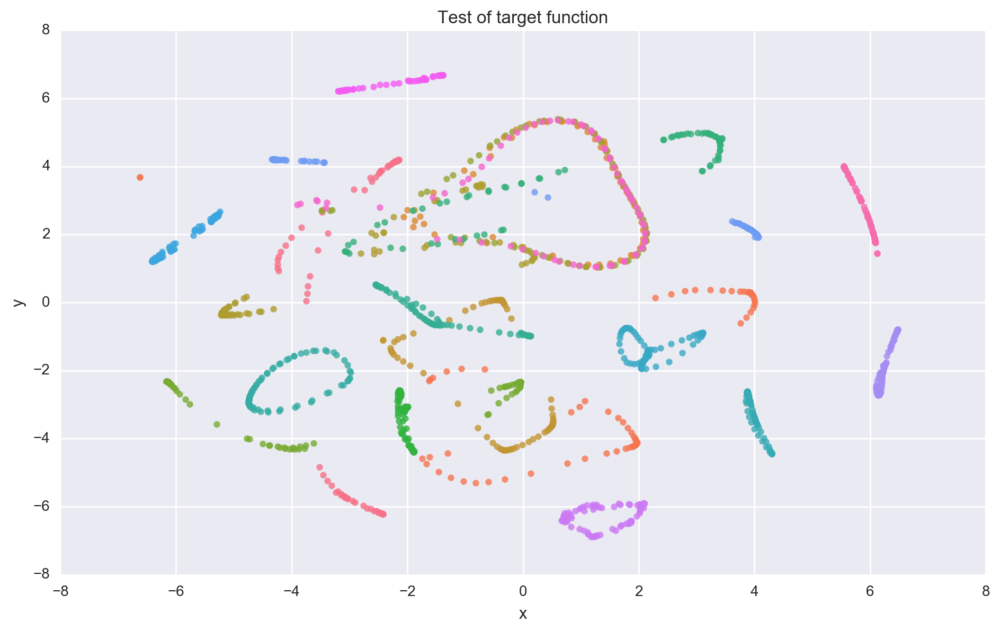

In [7]:
# let us study the result #
sns.lmplot(x='x', y='y', hue='target', data=embed, fit_reg=False, size=6, aspect=1.6, legend=False); plt.title('Test of target function');

## 3. Wrappers

We need to create wrappers for the target function, so it can work with the optimization packages we chose.

In [8]:
# wrapper for hyperopt #

# hyperopt minimizes functions, so our target value is set
class hp_wrapper:
    
    def __init__(self, data, save_path=None, n_runs=5):
        self.data = data
        self.save_path = save_path
        self.n_runs = n_runs
    
    def target(self, space):
        
        # pre-processing space
        space['pca_dims'] = int(space['pca_dims'])
        space['n_iter'] = int(space['n_iter'])
        
        # trying to ignore errors
        try:        
            # running target function
            kl_div, ami, ami_th, ami_tl, spearman, embed, params = optim_target(self.data, n_runs=self.n_runs, **space)    

            # if we want to save
            if not self.save_path == None:

                # creating path if necessary
                if not os.path.exists(self.save_path):
                    os.makedirs(self.save_path)

                # save name of the plot
                save_name = str(max([int(e.split('.')[0]) for e in os.listdir(self.save_path)]+[-1]) + 1) + '.png'

                # title of the plot
                plot_title = 'KL divergence: {0:.3f} | AMI score: {1:.3f} | AMI target-highd:'.format(kl_div, ami) + \
                             '{0:.3f} | AMI target-lowd: {1:.3f} | Rank-order correlation: {2:.3f}'.format(ami_th, ami_tl, spearman)

                # subtitle showing parameters
                subtitle = '{}'.format(params)

                # creating plot
                fig = sns.lmplot(x='x', y='y', hue='target', data=embed, fit_reg=False, size=9, aspect=1.6, legend=False); 
                plt.title(plot_title); plt.xlabel(subtitle)

                # saving
                fig.savefig(os.path.join(self.save_path,save_name))
                
                # do not show plot on jupyter
                plt.close()

            # a dict with 'loss' and 'status' is required
            return {'loss': -ami,
                    'status': STATUS_OK,
                    'parameters': params,
                    'embedding': embed}
        
        # catching exception
        except Exception as e:
            print 'An Error occurred:', e
            
            # a dict with 'loss' and 'status' is required
            return {'loss': 0,
                    'status': 'fail',
                    'parameters': space,
                    'embedding': 'error'}


In [9]:
# wrapper for BayesianOptimization #

# we need to coerce some variables to int, as the gaussian process regression only works with floats
class bo_wrapper:
    
    def __init__(self, data, save_path=None, n_runs=5):
        self.data = data
        self.save_path = save_path
        self.n_runs = n_runs
        
    def target(self, perplexity, early_exaggeration, learning_rate, n_iter, angle, pca_dims, whitening_flag):
    
        # pre-processing space
        pca_dims = int(pca_dims)
        n_iter = int(n_iter)

        # proxy for whitening flag
        if whitening_flag < 0.50:
            whitening_flag = False
        else:
            whitening_flag = True
        
        # hadling errors
        try:
    
            # running target function
            kl_div, ami, ami_th, ami_tl, spearman, embed, params = optim_target(self.data, perplexity, early_exaggeration, 
                                                                                learning_rate, n_iter, angle, pca_dims, 
                                                                                whitening_flag, n_runs=self.n_runs)
            # if we want to save
            if not self.save_path == None:

                # creating path if necessary
                if not os.path.exists(self.save_path):
                    os.makedirs(self.save_path)

                # save name of the plot
                save_name = str(max([int(e.split('.')[0]) for e in os.listdir(self.save_path)]+[-1]) + 1) + '.png'

                # title of the plot
                plot_title = 'KL divergence: {0:.3f} | AMI score: {1:.3f} | AMI target-highd:'.format(kl_div, ami) + \
                             '{0:.3f} | AMI target-lowd: {1:.3f} | Rank-order correlation: {2:.3f}'.format(ami_th, ami_tl, spearman)

                # subtitle showing parameters
                subtitle = '{}'.format(params)

                # creating plot
                fig = sns.lmplot(x='x', y='y', hue='target', data=embed, fit_reg=False, size=9, aspect=1.6, legend=False); 
                plt.title(plot_title); plt.xlabel(subtitle)

                # saving
                fig.savefig(os.path.join(self.save_path,save_name))
                
                # do not show plot on jupyter
                plt.close()

            # retuning target value: negative because BO maximizes functions
            return ami
        
        # catching exception
        except Exception as e:
            print 'An Error occurred:', e
            
            # a dict with 'loss' and 'status' is required
            return 0

In [10]:
# testing hyperopt wrapper
opt_task = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/test_figs', n_runs=1)
opt_task.target(space_base)['loss']

KL divergence: 1.8724489212 | AMI score: 0.613024245036
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.593382676379
Rank-order correlation: 0.0554985754986
Parameters: {'whitening_flag': False, 'n_iter': 1000, 'pca_dims': 30, 'angle': 0.5, 'learning_rate': 100, 'early_exaggeration': 4.0, 'perplexity': 30}
 


-0.6130242450355704

In [11]:
# testing bayes_opt wrapper
opt_task = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/test_figs', n_runs=1)
opt_task.target(**space_base)

KL divergence: 1.8724489212 | AMI score: 0.613024245036
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.593382676379
Rank-order correlation: 0.0554985754986
Parameters: {'whitening_flag': False, 'n_iter': 1000, 'pca_dims': 30, 'angle': 0.5, 'learning_rate': 100, 'early_exaggeration': 4.0, 'perplexity': 30}
 


0.6130242450355704

## 4. Optimization Tasks

Let us now create and execute our optimization tasks. We need to run 3 optimization procedures: Random Search, TPE and Gaussian Processes for 6 datasets. Let us divide our analysis by dataset.

In [12]:
# let us define an experiment dict #
# and index the results by dataset and optimization method #
# e.g. exp_dict['well_sep']['random_search'] refers to the results #
# of random search no the well-separated clusters data #

# defining dict
experiment_dict = dict()

# initializing dict
for dataset in ['well_sep', 'well_sep_noise', 'gaussian_noise', 'topology', 'coil_20', 'olivetti']:
    for optim in ['rand', 'tpe', 'gp']:
        try:
            experiment_dict[dataset][optim] = dict()
        except KeyError:
            experiment_dict[dataset] = dict()
            experiment_dict[dataset][optim] = dict()
            
# checking the result
experiment_dict

{'coil_20': {'gp': {}, 'rand': {}, 'tpe': {}},
 'gaussian_noise': {'gp': {}, 'rand': {}, 'tpe': {}},
 'olivetti': {'gp': {}, 'rand': {}, 'tpe': {}},
 'topology': {'gp': {}, 'rand': {}, 'tpe': {}},
 'well_sep': {'gp': {}, 'rand': {}, 'tpe': {}},
 'well_sep_noise': {'gp': {}, 'rand': {}, 'tpe': {}}}

### 4.1 Well-separated clusters

Set of 8 well-separated gaussian blobs in a 100-dimensional space.

In [13]:
# reading the data
test_df = pd.read_csv('data/final/well-sep.csv')

In [14]:
# storing target variable
test_target = test_df['TARGET']

In [15]:
# random search #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/well_sep_rand')

# trials object stores the evaluations
trials_rand = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=rand.suggest, space=space_hp, max_evals=50, trials=trials_rand)

# storing the results
experiment_dict['well_sep']['rand'] = [trials_rand.trials[i]['result'] for i in range(len(trials_rand.trials))]

KL divergence: 1.74608957767 | AMI score: 0.355197674467
AMI target-highd: 1.0 | AMI target-lowd: 0.355197674467
Rank-order correlation: 0.03125
Parameters: {'whitening_flag': False, 'n_iter': 1300, 'pca_dims': 85, 'angle': 0.448118774016554, 'learning_rate': 398.28822108290376, 'early_exaggeration': 7.134921279303432, 'perplexity': 2.0}
 
KL divergence: 0.182261765003 | AMI score: 1.0
AMI target-highd: 1.0 | AMI target-lowd: 1.0
Rank-order correlation: 0.0892857142857
Parameters: {'whitening_flag': False, 'n_iter': 4600, 'pca_dims': 20, 'angle': 0.5428778023496711, 'learning_rate': 589.1392734646593, 'early_exaggeration': 7.407343012221467, 'perplexity': 67.0}
 
KL divergence: 1.54330909252 | AMI score: 0.622440354815
AMI target-highd: 1.0 | AMI target-lowd: 0.622440354815
Rank-order correlation: -0.174107142857
Parameters: {'whitening_flag': True, 'n_iter': 4700, 'pca_dims': 10, 'angle': 0.795307853817645, 'learning_rate': 165.75274099600762, 'early_exaggeration': 3.7816303451006785,

In [16]:
# TPE #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/well_sep_tpe')

# trials object stores the evaluations
trials_tpe = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=tpe.suggest, space=space_hp, max_evals=50, trials=trials_tpe)

# storing the results
experiment_dict['well_sep']['tpe'] = [trials_tpe.trials[i]['result'] for i in range(len(trials_tpe.trials))]

KL divergence: 0.131686121225 | AMI score: 0.939307582755
AMI target-highd: 1.0 | AMI target-lowd: 0.939307582755
Rank-order correlation: -0.0535714285714
Parameters: {'whitening_flag': False, 'n_iter': 1900, 'pca_dims': 65, 'angle': 0.29056274904694945, 'learning_rate': 677.3215625861175, 'early_exaggeration': 7.09858999512526, 'perplexity': 76.0}
 
KL divergence: 0.959940195084 | AMI score: 0.000958285893424
AMI target-highd: 1.0 | AMI target-lowd: 0.000958285893424
Rank-order correlation: -0.0892857142857
Parameters: {'whitening_flag': True, 'n_iter': 3200, 'pca_dims': 85, 'angle': 0.4450246804731013, 'learning_rate': 644.8628957412384, 'early_exaggeration': 2.4029618871460596, 'perplexity': 199.0}
 
KL divergence: 0.0518660023808 | AMI score: 0.967765122494
AMI target-highd: 1.0 | AMI target-lowd: 0.967765122494
Rank-order correlation: 0.245535714286
Parameters: {'whitening_flag': False, 'n_iter': 500, 'pca_dims': 60, 'angle': 0.6065105840550946, 'learning_rate': 903.9137133313084,

In [17]:
# gaussian processes #

# initializing wrapper - BayesianOptimazion
opt_task_bo = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/well_sep_gp')

# defining optimization object
bo = BayesianOptimization(opt_task_bo.target, space_bo, verbose=0)

# optimizing
bo.maximize(init_points=10, n_iter=40, acq='ucb', kappa=10)

# writing results
experiment_dict['well_sep']['gp'] = bo.res['all']

KL divergence: 0.784997820854 | AMI score: -0.000232668724203
AMI target-highd: 1.0 | AMI target-lowd: -0.000232668724203
Rank-order correlation: -0.0133928571429
Parameters: {'whitening_flag': True, 'n_iter': 3339, 'pca_dims': 55, 'angle': 0.77545135152783007, 'learning_rate': 811.04476331859496, 'early_exaggeration': 7.3506720826231726, 'perplexity': 199.30129565021934}
 
KL divergence: 0.129389092326 | AMI score: 0.905822672268
AMI target-highd: 1.0 | AMI target-lowd: 0.905822672268
Rank-order correlation: 0.0223214285714
Parameters: {'whitening_flag': False, 'n_iter': 992, 'pca_dims': 24, 'angle': 0.33554508177818088, 'learning_rate': 592.13419075855347, 'early_exaggeration': 5.208552009898094, 'perplexity': 74.64577464302775}
 
KL divergence: 1.3078981638 | AMI score: 0.00182352709118
AMI target-highd: 1.0 | AMI target-lowd: 0.00182352709118
Rank-order correlation: -0.120535714286
Parameters: {'whitening_flag': True, 'n_iter': 456, 'pca_dims': 93, 'angle': 0.37492900967740417, 'le

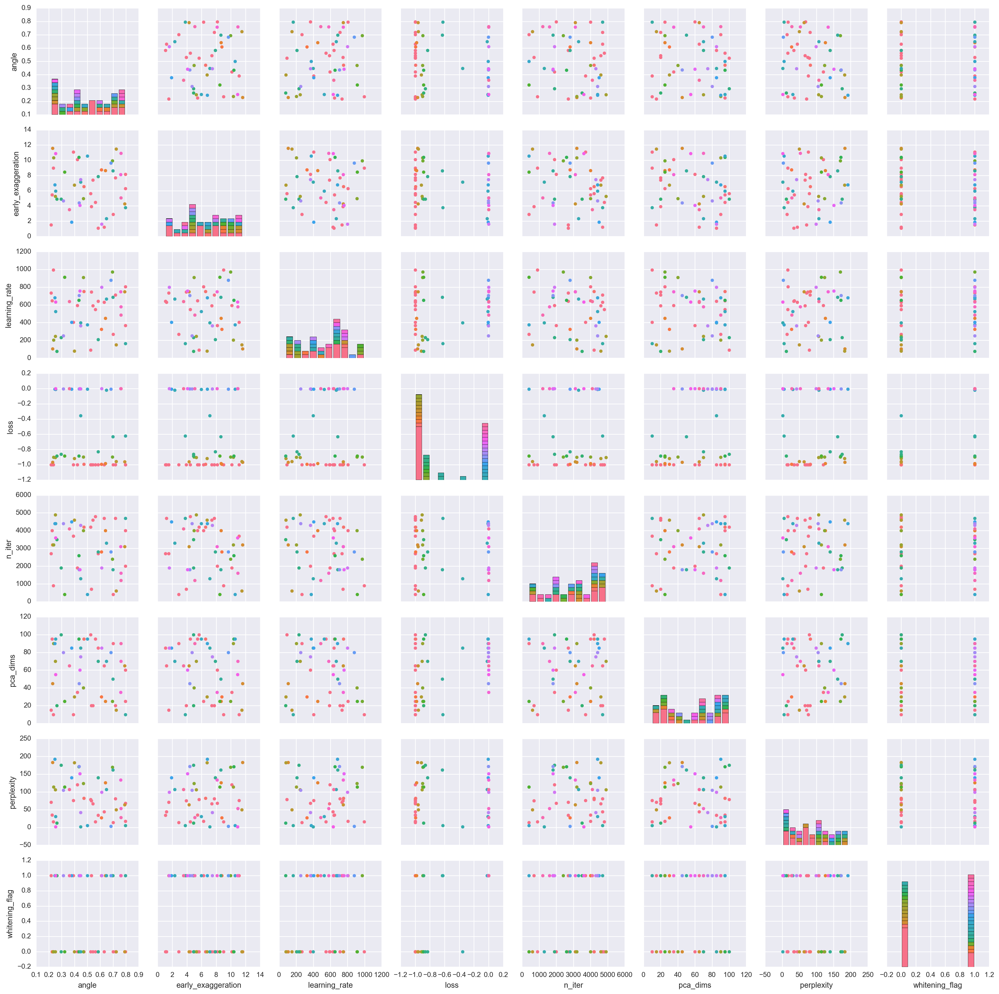

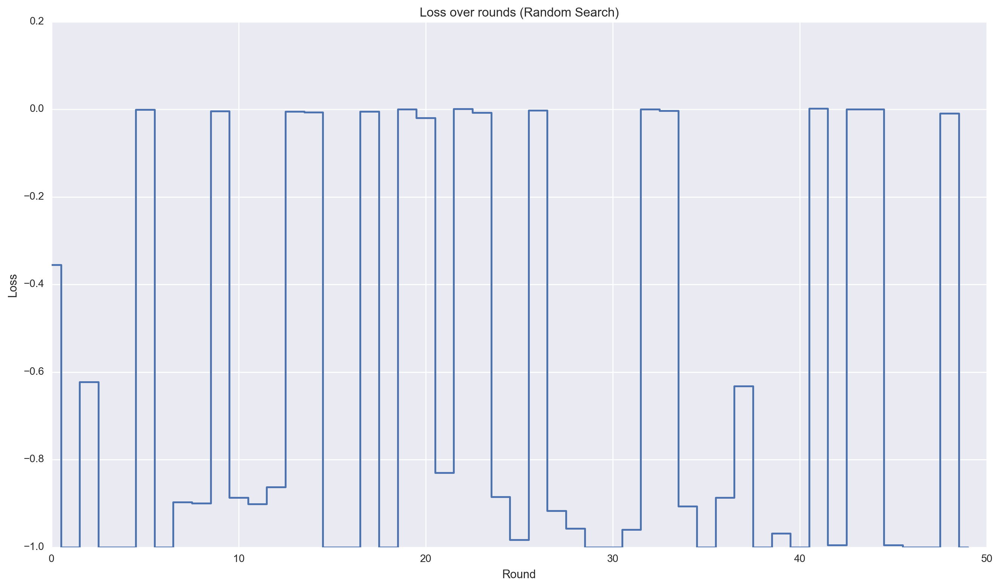

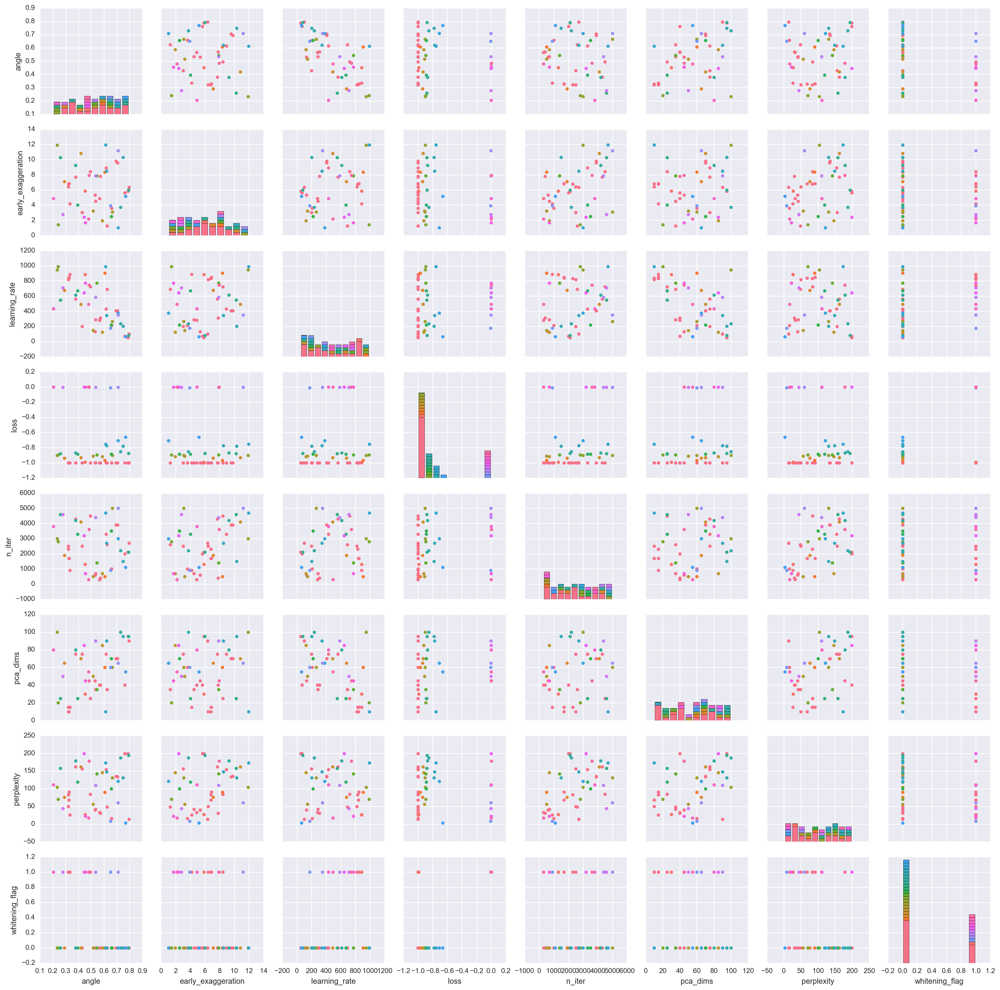

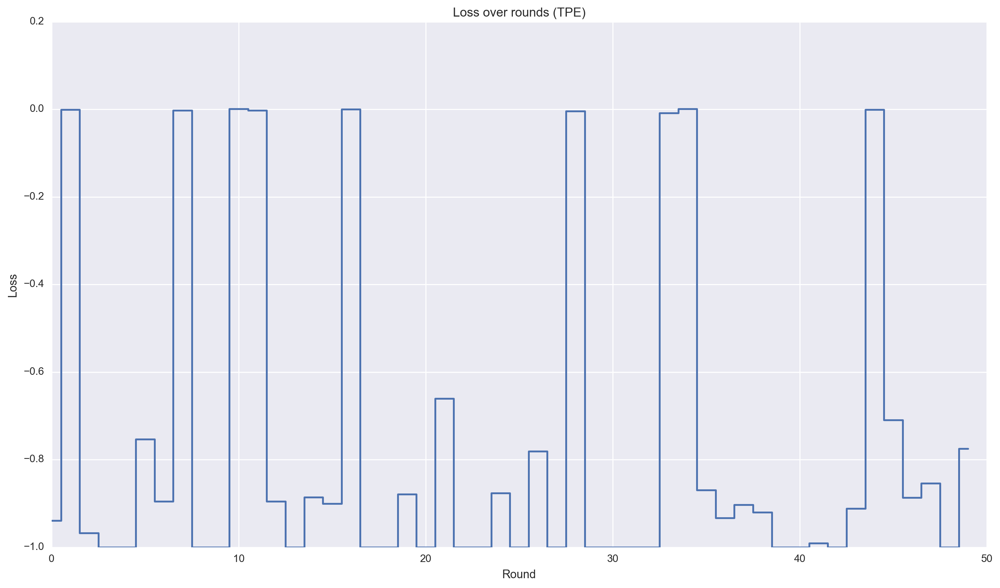

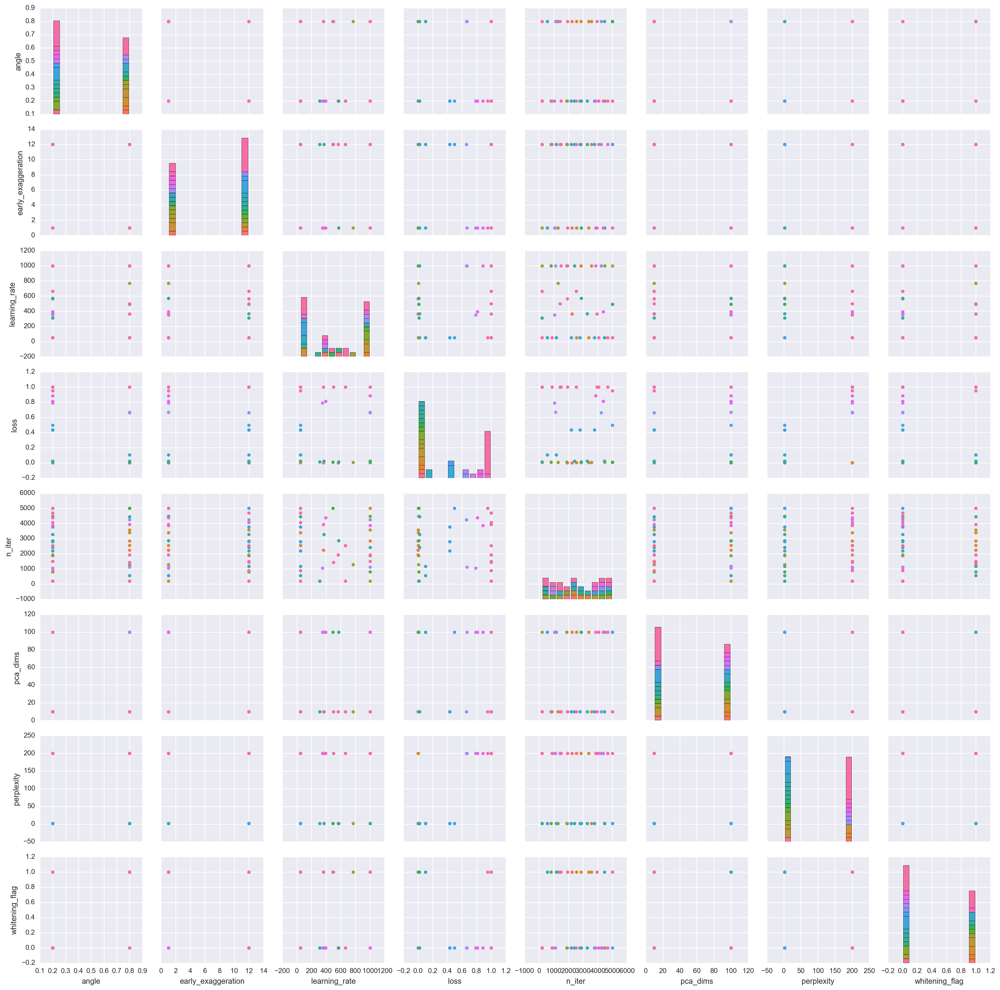

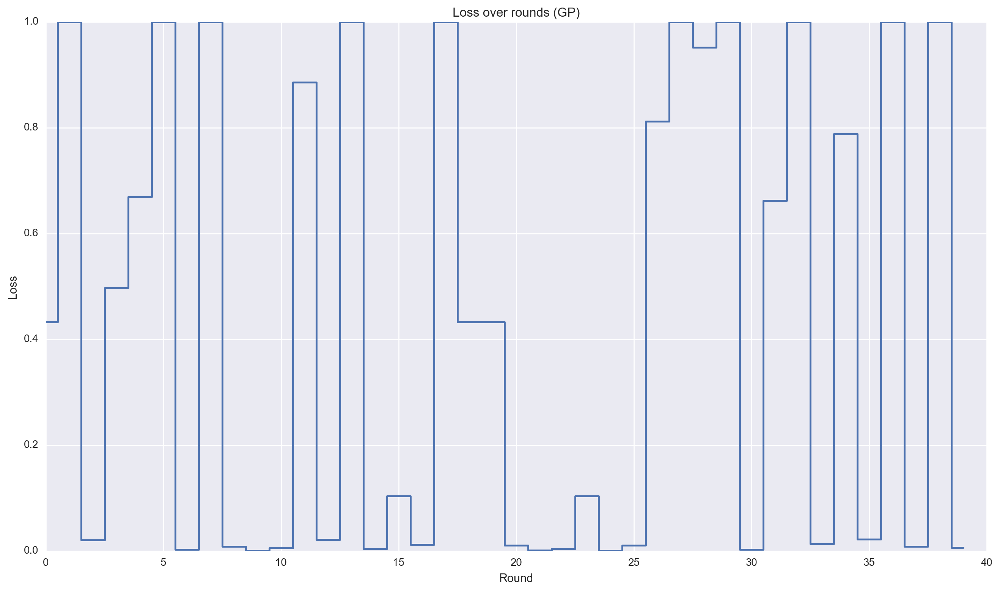

In [18]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = exp_dict['values']
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# random search #

# results data frame
rand_res_df = exp_dict_to_df_hp(experiment_dict['well_sep']['rand'])

# plotting hyperparameter importance
g = sns.PairGrid(rand_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/well_sep_rand.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(rand_res_df['loss'])), rand_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (Random Search)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/well_sep_rand.pdf');

# tpe #

# results data frame
tpe_res_df = exp_dict_to_df_hp(experiment_dict['well_sep']['tpe'])

# plotting hyperparameter importance
g = sns.PairGrid(tpe_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/well_sep_tpe.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(tpe_res_df['loss'])), tpe_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (TPE)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/well_sep_tpe.pdf');

# gaussian processes #

# results data frame
gp_res_df = exp_dict_to_df_bo(experiment_dict['well_sep']['gp'])

# plotting hyperparameter importance
g = sns.PairGrid(gp_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/well_sep_gp.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(gp_res_df['loss'])), gp_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (GP)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/well_sep_gp.pdf');

In [19]:
# showing best embedded spaces #
print "Random Search best:", [i for i,e in enumerate(experiment_dict['well_sep']['rand']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['well_sep']['rand']])]
print "TPE best:", [i for i,e in enumerate(experiment_dict['well_sep']['tpe']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['well_sep']['tpe']])]
print "GP best:", [i for i,e in enumerate(experiment_dict['well_sep']['gp']['values']) if e == np.max(experiment_dict['well_sep']['gp']['values'])]

Random Search best: [1, 3, 4, 6, 15, 16, 18, 29, 30, 35, 38, 40, 46, 47, 49]
TPE best: [3, 4, 8, 9, 13, 17, 18, 20, 22, 23, 25, 27, 29, 30, 31, 32, 39, 40, 42, 48]
GP best: [1, 5, 7, 13, 17, 27, 29, 32, 36, 38]


### 4.2 Well-separated clusters with noise

Set of 8 well-separated gaussian blobs in a 100-dimensional space under uniform noise.

In [20]:
# reading the data
test_df = pd.read_csv('data/final/well-sep-noise.csv')

In [21]:
# removing target variable
test_target = test_df['TARGET']

In [22]:
# random search #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/well_sep_noise_rand')

# trials object stores the evaluations
trials_rand = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=rand.suggest, space=space_hp, max_evals=50, trials=trials_rand)

# storing the results
experiment_dict['well_sep_noise']['rand'] = [trials_rand.trials[i]['result'] for i in range(len(trials_rand.trials))]

KL divergence: 1.00227642059 | AMI score: 0.750060321619
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.752242625835
Rank-order correlation: 0.0982142857143
Parameters: {'whitening_flag': False, 'n_iter': 600, 'pca_dims': 95, 'angle': 0.26210127888517387, 'learning_rate': 523.1312838673475, 'early_exaggeration': 4.129087759466611, 'perplexity': 21.0}
 
KL divergence: 0.165010333061 | AMI score: 0.763685072024
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.770248378298
Rank-order correlation: 0.174107142857
Parameters: {'whitening_flag': False, 'n_iter': 4100, 'pca_dims': 95, 'angle': 0.30613768743626374, 'learning_rate': 651.1976465709021, 'early_exaggeration': 6.964971536264641, 'perplexity': 146.0}
 
KL divergence: 0.666088759899 | AMI score: 0.773063845078
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.780231554209
Rank-order correlation: -0.0714285714286
Parameters: {'whitening_flag': True, 'n_iter': 1200, 'pca_dims': 30, 'angle': 0.7305635566244881, 'learning_

In [23]:
# TPE #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/well_sep_noise_tpe')

# trials object stores the evaluations
trials_tpe = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=tpe.suggest, space=space_hp, max_evals=50, trials=trials_tpe)

# storing the results
experiment_dict['well_sep_noise']['tpe'] = [trials_tpe.trials[i]['result'] for i in range(len(trials_tpe.trials))]

KL divergence: 0.616160511971 | AMI score: 0.985016312773
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.996637806411
Rank-order correlation: -0.0803571428571
Parameters: {'whitening_flag': False, 'n_iter': 3200, 'pca_dims': 70, 'angle': 0.7584067070670648, 'learning_rate': 476.63804078349995, 'early_exaggeration': 2.702523024631259, 'perplexity': 50.0}
 
KL divergence: 0.519376337528 | AMI score: 0.761414839946
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.765438603636
Rank-order correlation: -0.299107142857
Parameters: {'whitening_flag': True, 'n_iter': 3200, 'pca_dims': 55, 'angle': 0.7217566496314025, 'learning_rate': 925.0777795792055, 'early_exaggeration': 9.351434694827072, 'perplexity': 104.0}
 
KL divergence: 1.42942810059 | AMI score: 0.778530048534
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.783328787016
Rank-order correlation: -0.0848214285714
Parameters: {'whitening_flag': False, 'n_iter': 4800, 'pca_dims': 85, 'angle': 0.3094950377861067, 'learnin

In [24]:
# gaussian processes #

# initializing wrapper - BayesianOptimazion
opt_task_bo = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/well_sep_noise_gp')

# defining optimization object
bo = BayesianOptimization(opt_task_bo.target, space_bo, verbose=0)

# optimizing
bo.maximize(init_points=10, n_iter=40, acq='ucb', kappa=10)

# writing results
experiment_dict['well_sep_noise']['gp'] = bo.res['all']

KL divergence: 1.66321671009 | AMI score: 0.0090729432577
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.00888389668149
Rank-order correlation: -0.241071428571
Parameters: {'whitening_flag': True, 'n_iter': 1367, 'pca_dims': 67, 'angle': 0.2650852192069354, 'learning_rate': 655.0996071059169, 'early_exaggeration': 3.4511882179121227, 'perplexity': 4.2151110496603597}
 
KL divergence: 0.548231065273 | AMI score: 0.988115472641
AMI target-highd: 0.988115472641 | AMI target-lowd: 1.0
Rank-order correlation: -0.107142857143
Parameters: {'whitening_flag': False, 'n_iter': 1188, 'pca_dims': 35, 'angle': 0.38154949901960877, 'learning_rate': 978.09730211356498, 'early_exaggeration': 4.9376082479669074, 'perplexity': 55.618299509415699}
 
KL divergence: 1.71905791759 | AMI score: 0.00174413007816
AMI target-highd: 0.988115472641 | AMI target-lowd: 0.00168885067633
Rank-order correlation: 0.0446428571429
Parameters: {'whitening_flag': True, 'n_iter': 4579, 'pca_dims': 80, 'angle': 0.3585

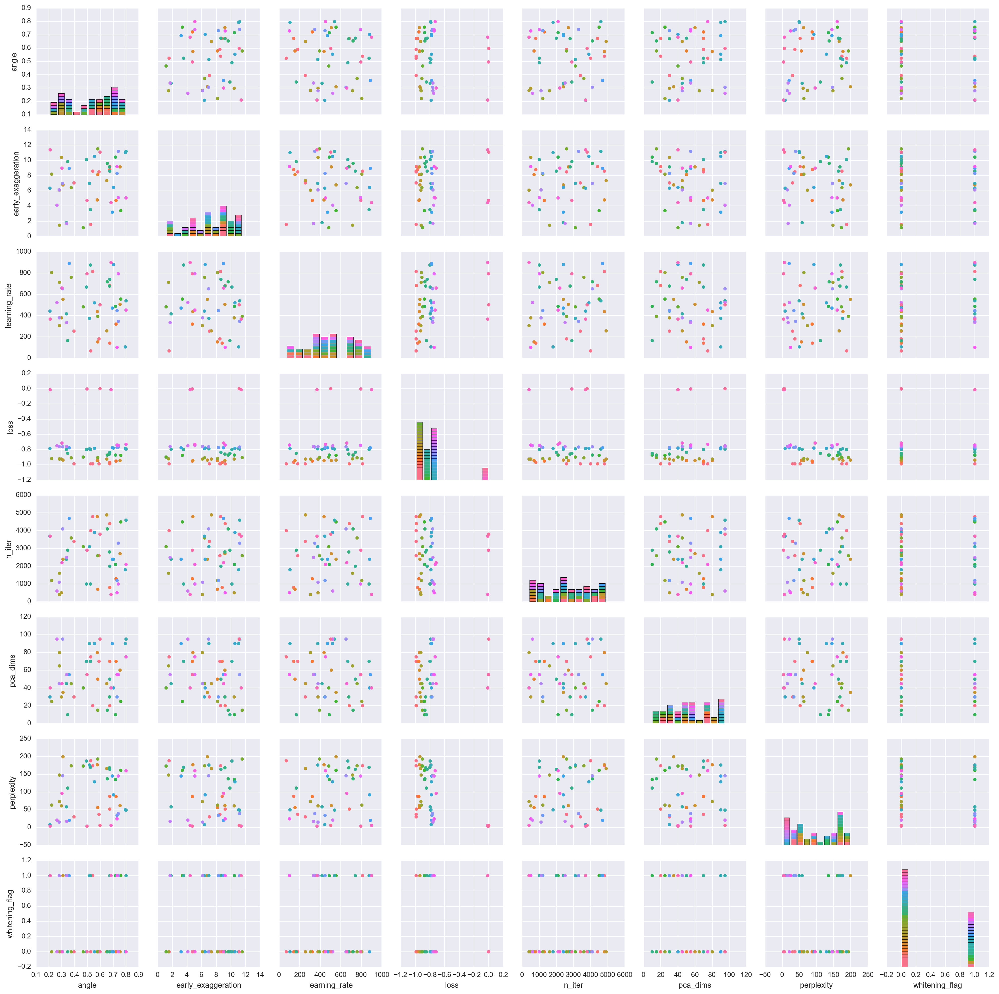

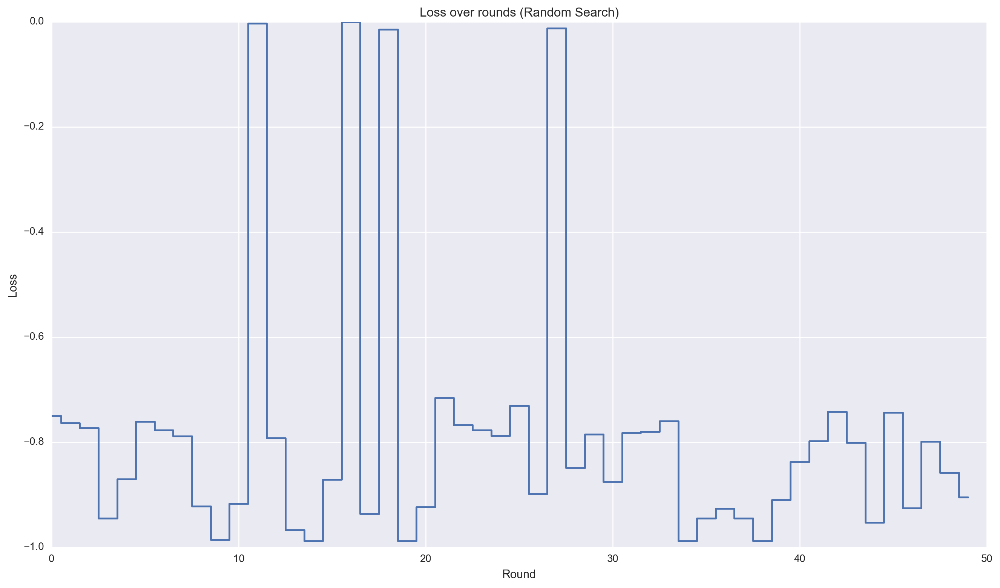

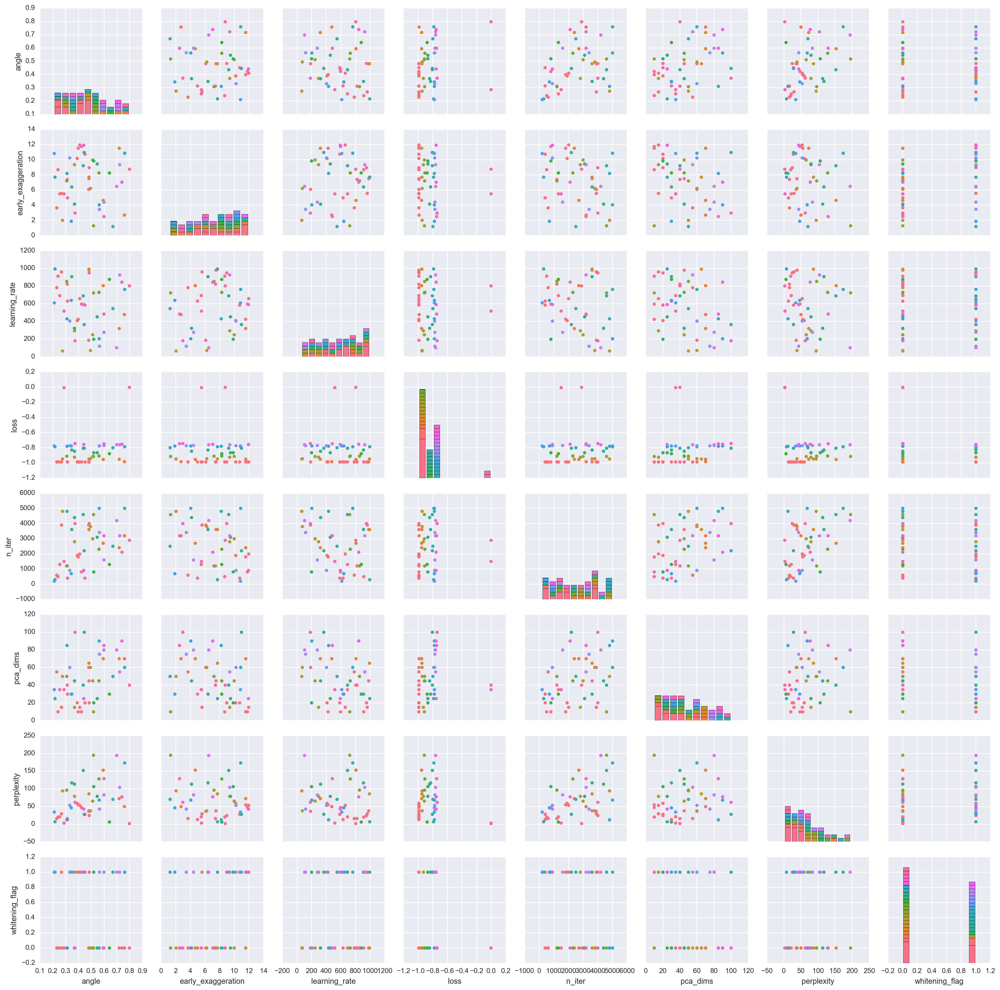

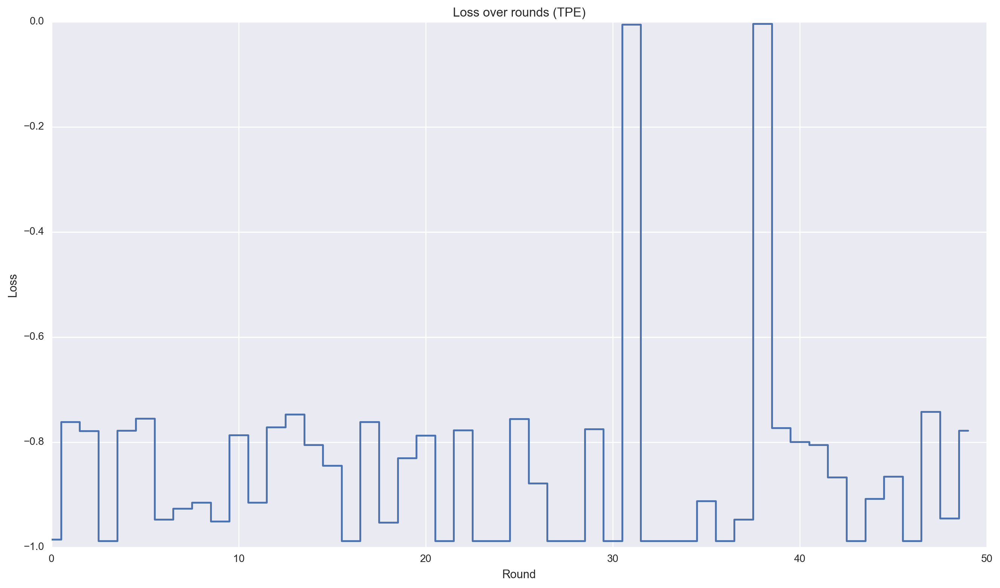

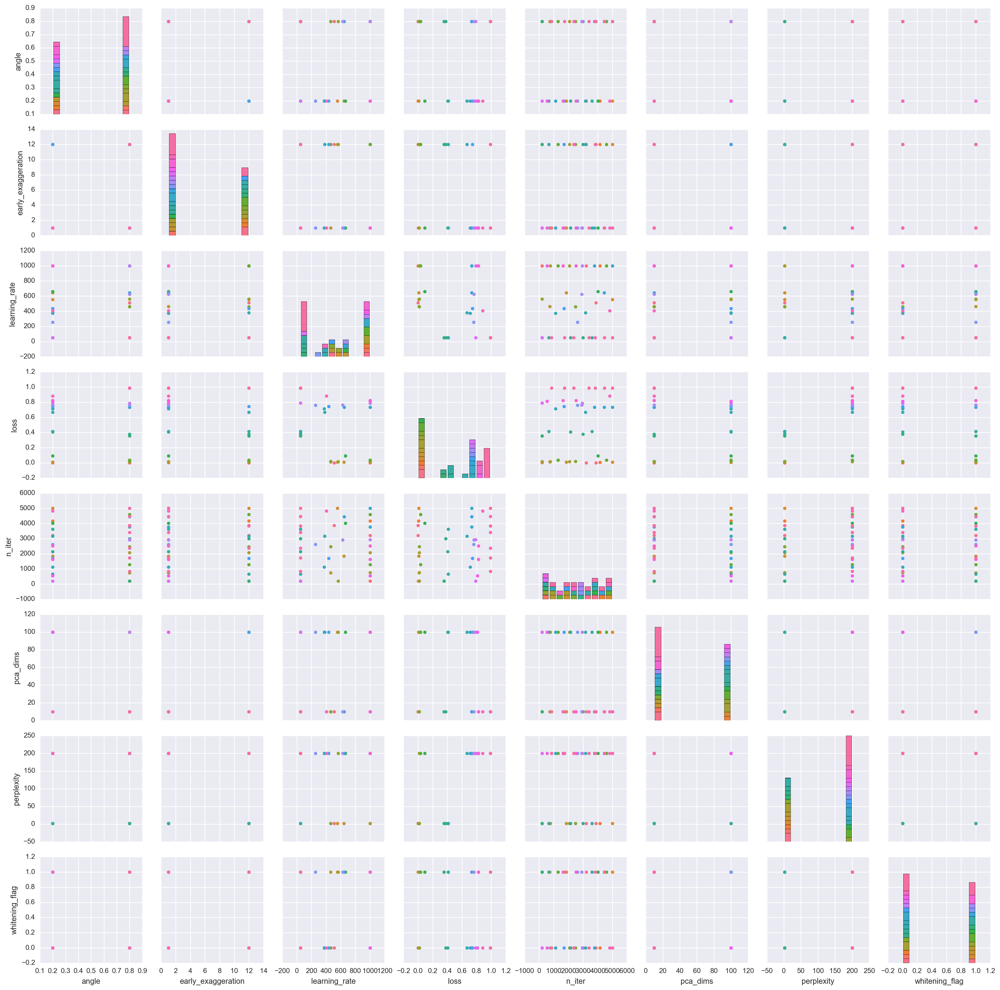

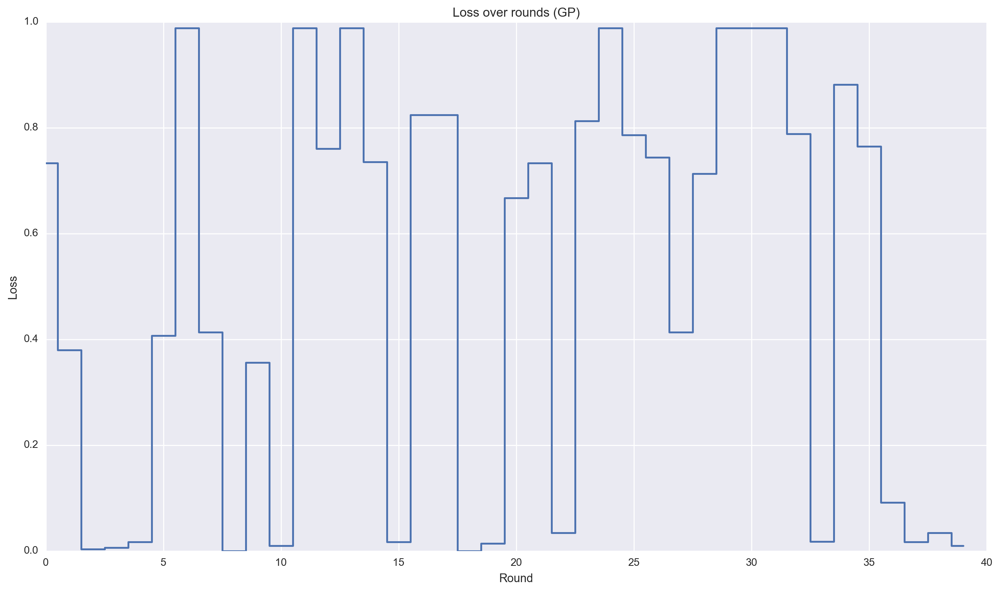

In [25]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = exp_dict['values']
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# random search #

# results data frame
rand_res_df = exp_dict_to_df_hp(experiment_dict['well_sep_noise']['rand'])

# plotting hyperparameter importance
g = sns.PairGrid(rand_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/well_sep_noise_rand.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(rand_res_df['loss'])), rand_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (Random Search)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/well_sep_noise_rand.pdf');

# tpe #

# results data frame
tpe_res_df = exp_dict_to_df_hp(experiment_dict['well_sep_noise']['tpe'])

# plotting hyperparameter importance
g = sns.PairGrid(tpe_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/well_sep_noise_tpe.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(tpe_res_df['loss'])), tpe_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (TPE)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/well_sep_noise_tpe.pdf');

# gaussian processes #

# results data frame
gp_res_df = exp_dict_to_df_bo(experiment_dict['well_sep_noise']['gp'])

# plotting hyperparameter importance
g = sns.PairGrid(gp_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/well_sep_noise_gp.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(gp_res_df['loss'])), gp_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (GP)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/well_sep_noise_gp.pdf');

In [26]:
# showing best embedded spaces #
print "Random Search best:", [i for i,e in enumerate(experiment_dict['well_sep_noise']['rand']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['well_sep_noise']['rand']])]
print "TPE best:", [i for i,e in enumerate(experiment_dict['well_sep_noise']['tpe']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['well_sep_noise']['tpe']])]
print "GP best:", [i for i,e in enumerate(experiment_dict['well_sep_noise']['gp']['values']) if e == np.max(experiment_dict['well_sep_noise']['gp']['values'])]

Random Search best: [14, 19, 34, 38]
TPE best: [3, 16, 21, 24, 27, 28, 30, 34, 36, 43, 46]
GP best: [6, 11, 13, 24, 29, 30, 31]


### 4.3 200-dimensional gaussian noise

Gaussian noise centered on origin. No clusters nor significant patterns to show.

In [27]:
# reading the data
test_df = pd.read_csv('data/final/gaussian-noise.csv')

In [28]:
# removing target variable
test_target = test_df['TARGET']

In [29]:
# random search #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/gaussian_noise_rand')

# trials object stores the evaluations
trials_rand = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=rand.suggest, space=space_hp, max_evals=50, trials=trials_rand)

# storing the results
experiment_dict['gaussian_noise']['rand'] = [trials_rand.trials[i]['result'] for i in range(len(trials_rand.trials))]

KL divergence: 0.794794678688 | AMI score: -0.00128243737723
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 0.0
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 2300, 'pca_dims': 35, 'angle': 0.542582855800215, 'learning_rate': 871.8766710542545, 'early_exaggeration': 3.321247225716686, 'perplexity': 196.0}
 
KL divergence: 1.68452632427 | AMI score: 0.00235808231337
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 2.65549233285e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 2400, 'pca_dims': 90, 'angle': 0.5145815119416097, 'learning_rate': 304.70517197776115, 'early_exaggeration': 4.060979098537874, 'perplexity': 48.0}
 
KL divergence: 1.6564116478 | AMI score: 0.00278028461453
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -7.10884587482e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 2600, 'pca_dims': 10, 'angle': 0.7189236241192238, 'learning_rate': 760.20703037703

In [30]:
# TPE #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/gaussian_noise_tpe')

# trials object stores the evaluations
trials_tpe = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=tpe.suggest, space=space_hp, max_evals=50, trials=trials_tpe)

# storing the results
experiment_dict['gaussian_noise']['tpe'] = [trials_tpe.trials[i]['result'] for i in range(len(trials_tpe.trials))]

KL divergence: 0.931549429893 | AMI score: 0.00989356355859
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 8.57633925549e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4400, 'pca_dims': 90, 'angle': 0.41177198603551973, 'learning_rate': 889.8489610169466, 'early_exaggeration': 11.180796998917382, 'perplexity': 180.0}
 
KL divergence: 0.90294778347 | AMI score: 0.0010992147535
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -6.39748607417e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 1000, 'pca_dims': 60, 'angle': 0.5312420174709545, 'learning_rate': 583.0442229827893, 'early_exaggeration': 1.1835704184954663, 'perplexity': 178.0}
 
KL divergence: 0.807163774967 | AMI score: 0.00115275699827
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -2.78781026878e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4100, 'pca_dims': 90, 'angle': 0.3305507678705878, 'learning_rat

In [31]:
# gaussian processes #

# initializing wrapper - BayesianOptimazion
opt_task_bo = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/gaussian_noise_gp')

# defining optimization object
bo = BayesianOptimization(opt_task_bo.target, space_bo, verbose=0)

# optimizing
bo.maximize(init_points=10, n_iter=40, acq='ucb', kappa=10)

# writing results
experiment_dict['gaussian_noise']['gp'] = bo.res['all']

KL divergence: 1.35397648811 | AMI score: 0.0016486180114
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -6.48869350778e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 298, 'pca_dims': 65, 'angle': 0.56452691114086306, 'learning_rate': 165.93632310253989, 'early_exaggeration': 11.665430905410144, 'perplexity': 78.958103358517434}
 
KL divergence: 1.47278666496 | AMI score: 0.000564614130126
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -1.14427441032e-14
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4855, 'pca_dims': 22, 'angle': 0.30231447421237495, 'learning_rate': 520.4180646057066, 'early_exaggeration': 9.5264610569722592, 'perplexity': 55.727108291231389}
 
KL divergence: 0.817819774151 | AMI score: -0.000691817508822
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -6.81102649668e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4195, 'pca_dims': 36, 'angle': 0.2

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:308: UserWarning: Predicted variances smaller than 0. Setting those variances to 0.
  warnings.warn("Predicted variances smaller than 0. "


KL divergence: 1.81138825417 | AMI score: -0.00137794052226
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 0.0
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 211, 'pca_dims': 91, 'angle': 0.31692115209325855, 'learning_rate': 993.82776735238781, 'early_exaggeration': 3.4546898950193938, 'perplexity': 40.055165396817813}
 
KL divergence: 2.15423798561 | AMI score: 0.00386018993207
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -4.45138716084e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4979, 'pca_dims': 99, 'angle': 0.25317422016968821, 'learning_rate': 59.901222575244091, 'early_exaggeration': 3.8498286878160908, 'perplexity': 2.0980965876095432}
 


C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([-0.00017552]), 'nit': 4, 'funcalls': 51}
  " state: %s" % convergence_dict)


KL divergence: 0.898777544498 | AMI score: 0.0594047236779
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -2.3283203547e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4968, 'pca_dims': 96, 'angle': 0.69061757460737505, 'learning_rate': 984.4807594699123, 'early_exaggeration': 11.696807861643597, 'perplexity': 190.29931333895726}
 
KL divergence: 2.29340600967 | AMI score: 0.0015892907596
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 1.05188577289e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3138, 'pca_dims': 92, 'angle': 0.40886057030087714, 'learning_rate': 60.191532714466888, 'early_exaggeration': 9.3532206251124705, 'perplexity': 13.294260522303226}
 
KL divergence: 1.21146595478 | AMI score: -0.00289425702513
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -8.84540364263e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 2027, 'pca_dims': 98, 'angle': 0.6932

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([  2.24024416e-05]), 'nit': 5, 'funcalls': 48}
  " state: %s" % convergence_dict)


KL divergence: 0.768980026245 | AMI score: 0.00313615047394
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -2.3283203547e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3325, 'pca_dims': 19, 'angle': 0.59470718276182166, 'learning_rate': 999.44303948213326, 'early_exaggeration': 1.5303324274661163, 'perplexity': 195.48048847582083}
 
KL divergence: 0.959732055664 | AMI score: -0.00107892600098
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -1.58624297518e-14
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 2234, 'pca_dims': 99, 'angle': 0.72701023448673241, 'learning_rate': 55.835599480257756, 'early_exaggeration': 4.7714919243726683, 'perplexity': 192.47457182531312}
 
KL divergence: 0.673224389553 | AMI score: 0.00294987972619
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -2.6040891882e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4992, 'pca_dims': 30, 'angle': 0

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([ -1.57602573e-05]), 'nit': 5, 'funcalls': 52}
  " state: %s" % convergence_dict)


KL divergence: 0.62198472023 | AMI score: 0.0015892907596
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 1.05188577289e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 485, 'pca_dims': 10, 'angle': 0.65413393364479044, 'learning_rate': 725.71008672845369, 'early_exaggeration': 3.3220019059819954, 'perplexity': 198.84725099119058}
 
KL divergence: 0.831160306931 | AMI score: -0.00391290723612
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 8.57633925549e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 807, 'pca_dims': 86, 'angle': 0.68745239098716282, 'learning_rate': 63.44434056326412, 'early_exaggeration': 2.9665812286220792, 'perplexity': 198.28650585420968}
 


C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([ -1.04689237e-05]), 'nit': 6, 'funcalls': 54}
  " state: %s" % convergence_dict)


KL divergence: 1.98059749603 | AMI score: 0.00537582506646
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -1.70446186271e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 730, 'pca_dims': 98, 'angle': 0.72983247150140107, 'learning_rate': 969.40222599907861, 'early_exaggeration': 10.229752752256472, 'perplexity': 8.7291363864160676}
 
KL divergence: 1.83754789829 | AMI score: -3.07372715042e-05
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -1.39815840576e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3253, 'pca_dims': 99, 'angle': 0.34829084950057254, 'learning_rate': 632.42689197109542, 'early_exaggeration': 7.2314639748554903, 'perplexity': 5.1761911299803076}
 
KL divergence: 1.04157781601 | AMI score: -0.00155676091462
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -3.12917430307e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 4989, 'pca_dims': 99, 'angle': 

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([  2.27139932e-05]), 'nit': 6, 'funcalls': 49}
  " state: %s" % convergence_dict)


KL divergence: 1.78913295269 | AMI score: -0.0023157325583
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: 8.91940796303e-16
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 4175, 'pca_dims': 18, 'angle': 0.44064967431603147, 'learning_rate': 533.05098268204711, 'early_exaggeration': 3.0089712809279869, 'perplexity': 4.2275041858056124}
 
KL divergence: 0.780711293221 | AMI score: -0.00338388578619
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -7.68951609125e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 3856, 'pca_dims': 19, 'angle': 0.66630563017641209, 'learning_rate': 976.23591810799269, 'early_exaggeration': 9.8035074621677634, 'perplexity': 189.03524352930444}
 
KL divergence: 1.67551970482 | AMI score: 0.00340672773151
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -7.68951609125e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 1696, 'pca_dims': 11, 'angle': 0.

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([ -2.59564227e-05]), 'nit': 4, 'funcalls': 48}
  " state: %s" % convergence_dict)


KL divergence: 1.95922279358 | AMI score: -0.00333425877999
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -2.90096045306e-14
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3467, 'pca_dims': 95, 'angle': 0.76708056767921451, 'learning_rate': 970.69029314431407, 'early_exaggeration': 6.1104589134748259, 'perplexity': 6.6043375846922165}
 
KL divergence: 0.827900886536 | AMI score: 0.00144065948624
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -9.78032392002e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 943, 'pca_dims': 35, 'angle': 0.76559354433079307, 'learning_rate': 994.97268062232854, 'early_exaggeration': 2.9914352794511827, 'perplexity': 192.37316506195813}
 
KL divergence: 1.09544992447 | AMI score: 0.000885739143338
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -3.6939963871e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 4568, 'pca_dims': 98, 'angle': 0.

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([ -2.10558542e-05]), 'nit': 4, 'funcalls': 48}
  " state: %s" % convergence_dict)


KL divergence: 2.4425573349 | AMI score: 0.00122660865121
AMI target-highd: -5.03930757257e-16 | AMI target-lowd: -4.06131351889e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 698, 'pca_dims': 44, 'angle': 0.50627699842230989, 'learning_rate': 56.224162610247632, 'early_exaggeration': 8.7553134728381963, 'perplexity': 4.1687220764481765}
 


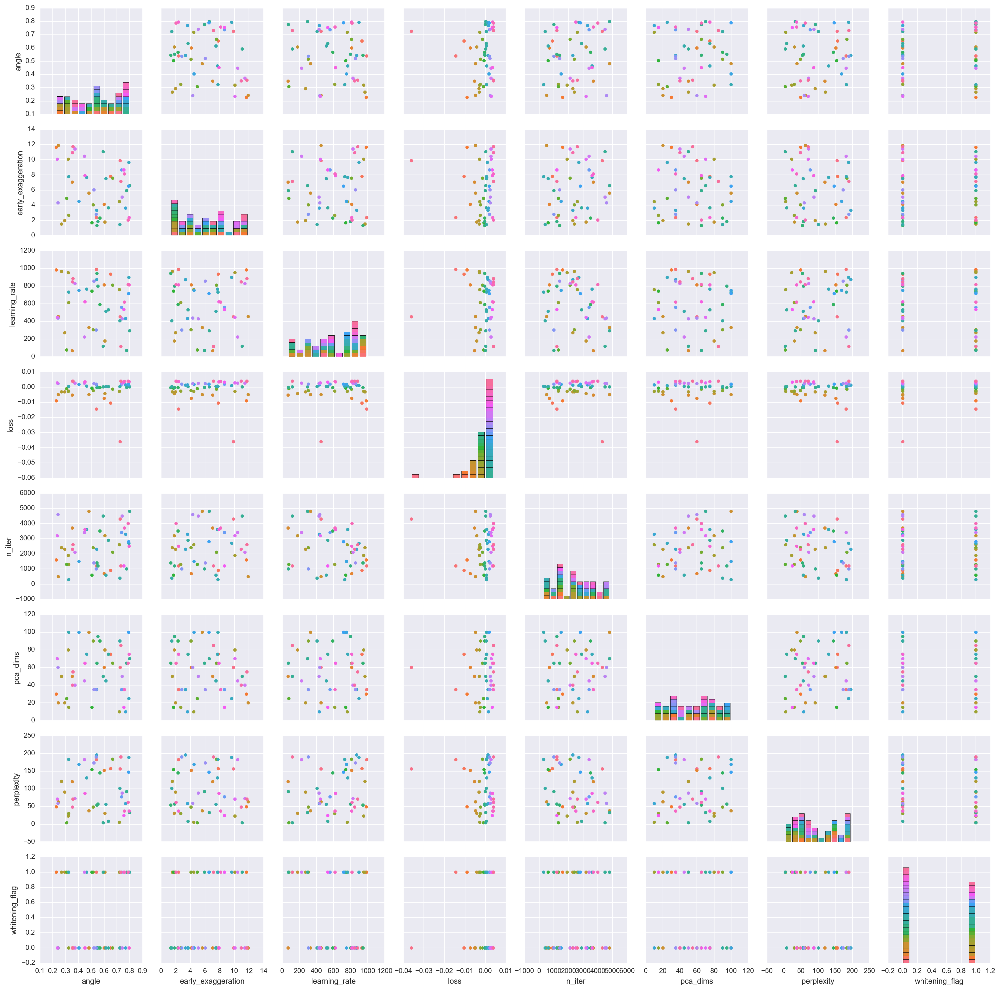

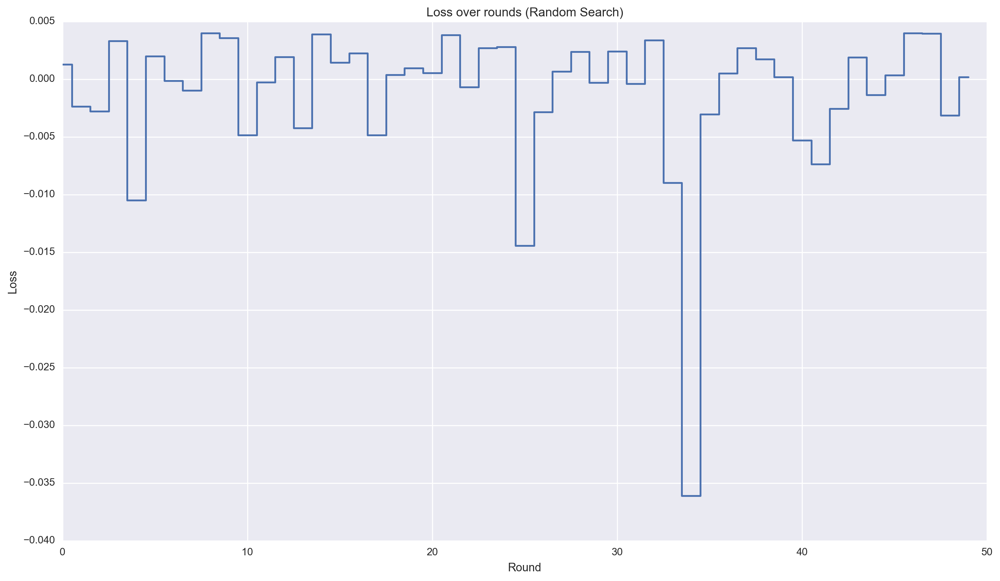

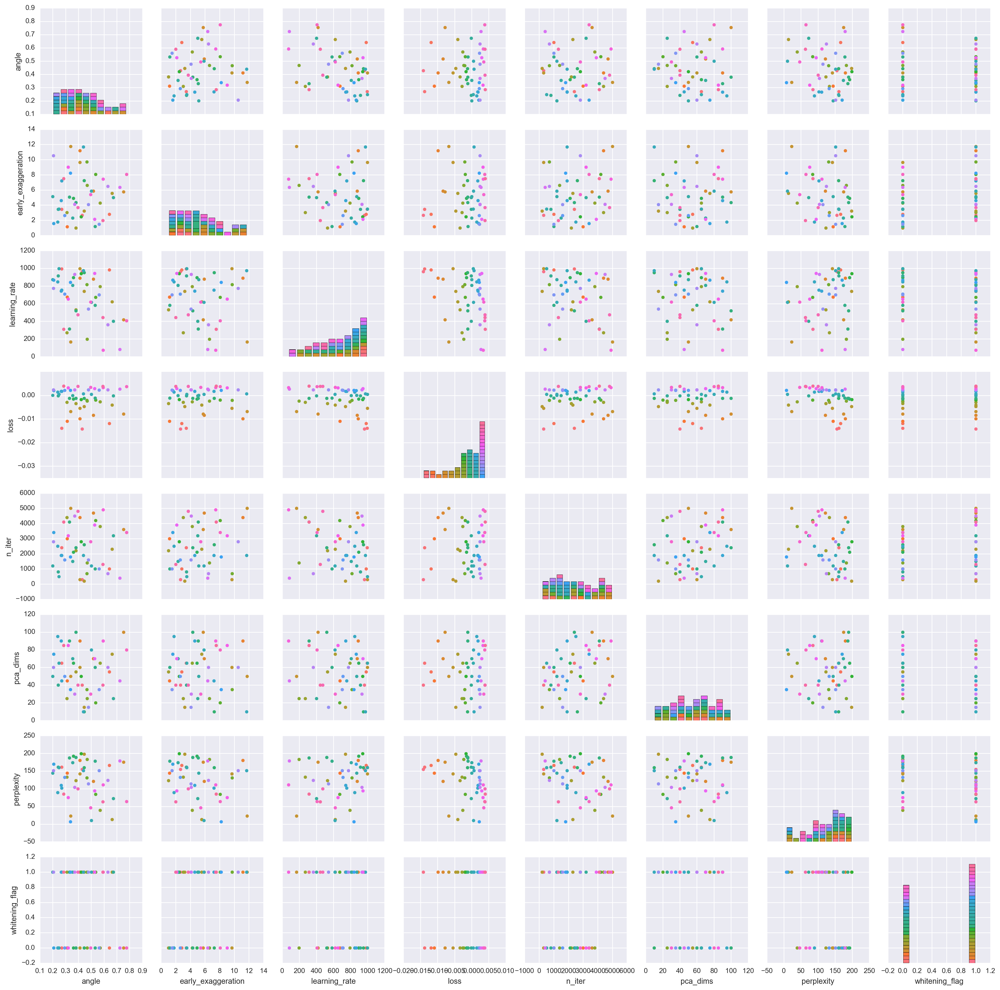

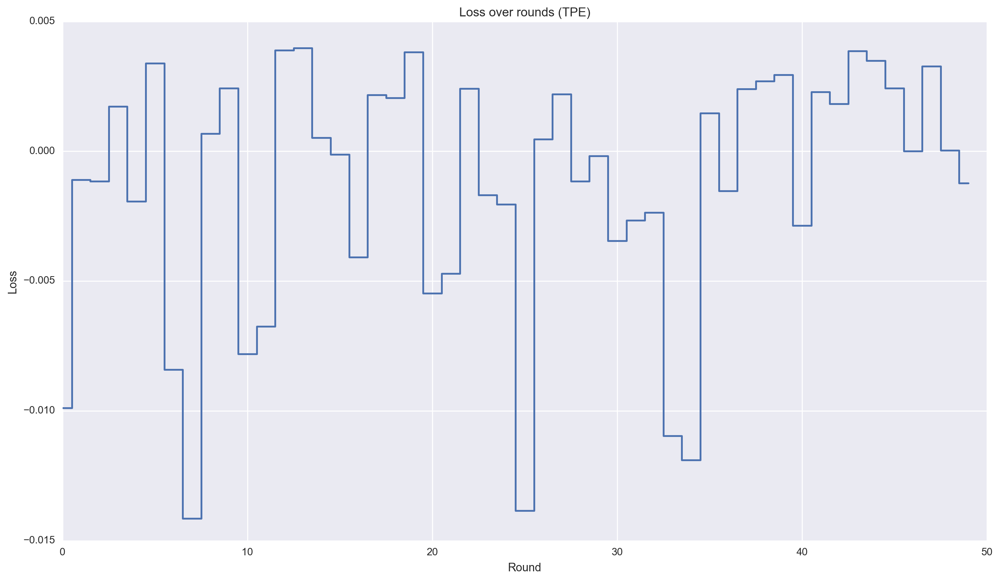

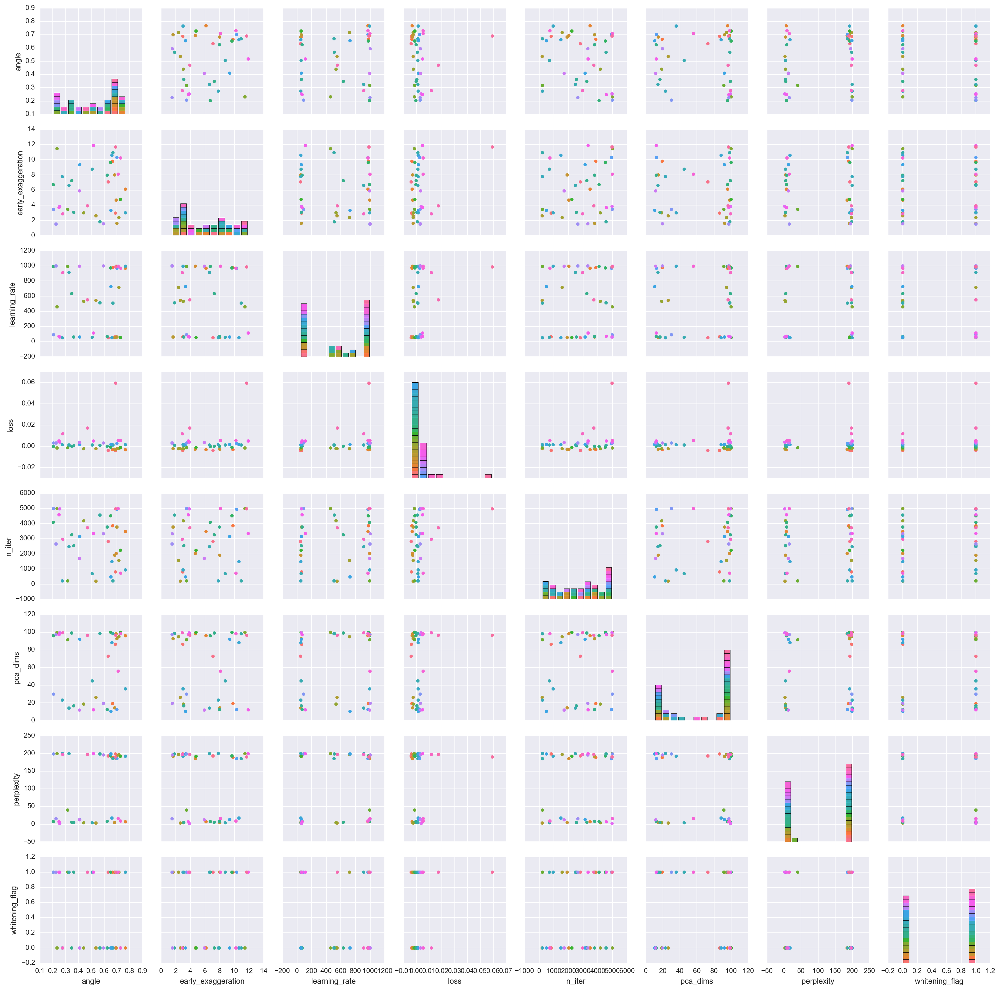

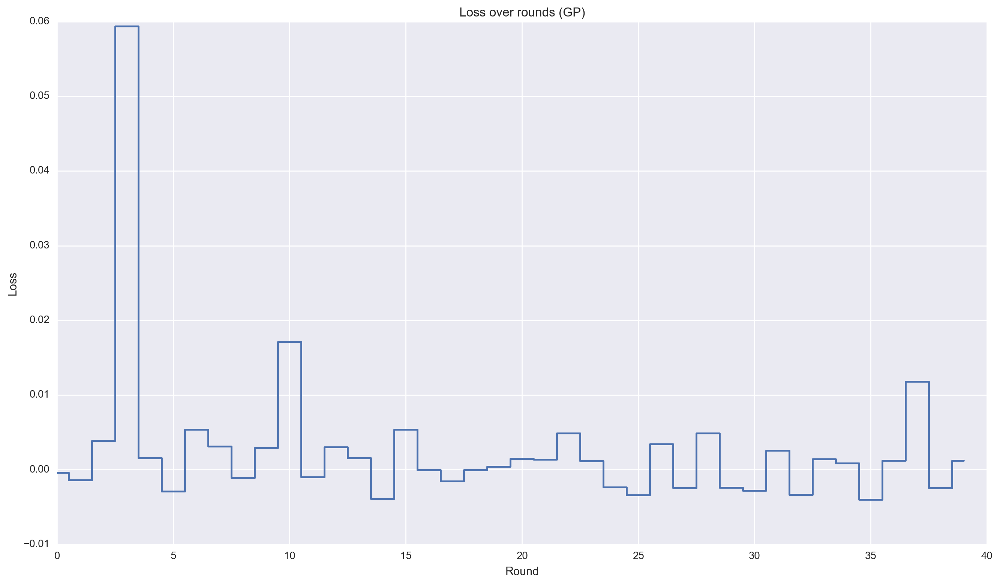

In [32]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = exp_dict['values']
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# random search #

# results data frame
rand_res_df = exp_dict_to_df_hp(experiment_dict['gaussian_noise']['rand'])

# plotting hyperparameter importance
g = sns.PairGrid(rand_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/gaussian_noise_rand.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(rand_res_df['loss'])), rand_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (Random Search)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/gaussian_noise_rand.pdf');

# tpe #

# results data frame
tpe_res_df = exp_dict_to_df_hp(experiment_dict['gaussian_noise']['tpe'])

# plotting hyperparameter importance
g = sns.PairGrid(tpe_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/gaussian_noise_tpe.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(tpe_res_df['loss'])), tpe_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (TPE)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/gaussian_noise_tpe.pdf');

# gaussian processes #

# results data frame
gp_res_df = exp_dict_to_df_bo(experiment_dict['gaussian_noise']['gp'])

# plotting hyperparameter importance
g = sns.PairGrid(gp_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/gaussian_noise_gp.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(gp_res_df['loss'])), gp_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (GP)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/gaussian_noise_gp.pdf');

In [33]:
# showing best embedded spaces #
print "Random Search best:", [i for i,e in enumerate(experiment_dict['gaussian_noise']['rand']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['gaussian_noise']['rand']])]
print "TPE best:", [i for i,e in enumerate(experiment_dict['gaussian_noise']['tpe']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['gaussian_noise']['tpe']])]
print "GP best:", [i for i,e in enumerate(experiment_dict['gaussian_noise']['gp']['values']) if e == np.max(experiment_dict['gaussian_noise']['gp']['values'])]

Random Search best: [34]
TPE best: [7]
GP best: [3]


### 4.4 Two gaussian distributions with different densities

Two gaussian distributions centered on the origin, but with different standard deviations.

In [34]:
# reading the data
test_df = pd.read_csv('data/final/topology.csv')

In [35]:
# removing target variable
test_target = test_df['TARGET']

In [36]:
# random search #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/topology_rand')

# trials object stores the evaluations
trials_rand = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=rand.suggest, space=space_hp, max_evals=50, trials=trials_rand)

# storing the results
experiment_dict['topology']['rand'] = [trials_rand.trials[i]['result'] for i in range(len(trials_rand.trials))]

KL divergence: 1.09444916248 | AMI score: 0.0317289000591
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.163513925082
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4200, 'pca_dims': 15, 'angle': 0.782939856888025, 'learning_rate': 832.395178429131, 'early_exaggeration': 7.544157089284338, 'perplexity': 199.0}
 
KL divergence: 1.08957326412 | AMI score: 0.0499620600387
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.155124589942
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 200, 'pca_dims': 70, 'angle': 0.5492132282099538, 'learning_rate': 224.40779202006226, 'early_exaggeration': 8.655117860033524, 'perplexity': 100.0}
 
KL divergence: 2.00612831116 | AMI score: 2.13449933459e-15
AMI target-highd: 0.0670054346155 | AMI target-lowd: -3.34309520488e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 1900, 'pca_dims': 20, 'angle': 0.489639225266181, 'learning_rate': 117.2440817220701, '

In [37]:
# TPE #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/topology_tpe')

# trials object stores the evaluations
trials_tpe = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=tpe.suggest, space=space_hp, max_evals=50, trials=trials_tpe)

# storing the results
experiment_dict['topology']['tpe'] = [trials_tpe.trials[i]['result'] for i in range(len(trials_tpe.trials))]

KL divergence: 1.77429914474 | AMI score: 0.00544700541863
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.00741053130542
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3400, 'pca_dims': 85, 'angle': 0.6934395516775537, 'learning_rate': 741.9757349005391, 'early_exaggeration': 5.420316843896653, 'perplexity': 7.0}
 
KL divergence: 1.17761337757 | AMI score: -0.00226339793183
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.00639148084658
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 1400, 'pca_dims': 100, 'angle': 0.36913565816651794, 'learning_rate': 995.5223943497696, 'early_exaggeration': 1.820663785273334, 'perplexity': 195.0}
 
KL divergence: 1.62526929379 | AMI score: 0.0218726091682
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.105396133493
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 2800, 'pca_dims': 40, 'angle': 0.7853085000629234, 'learning_rate': 767.6064953464

In [38]:
# gaussian processes #

# initializing wrapper - BayesianOptimazion
opt_task_bo = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/topology_gp')

# defining optimization object
bo = BayesianOptimization(opt_task_bo.target, space_bo, verbose=0)

# optimizing
bo.maximize(init_points=10, n_iter=40, acq='ucb', kappa=10)

# writing results
experiment_dict['topology']['gp'] = bo.res['all']

KL divergence: 1.45228838921 | AMI score: 0.0538865981681
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.0774423844352
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 2615, 'pca_dims': 86, 'angle': 0.69548125340958011, 'learning_rate': 521.58637022606604, 'early_exaggeration': 7.3106662502805815, 'perplexity': 31.955658792966666}
 
KL divergence: 0.8736500144 | AMI score: 0.0218225255823
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.00025695167289
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3106, 'pca_dims': 48, 'angle': 0.66046981535285554, 'learning_rate': 183.67321965898603, 'early_exaggeration': 11.259301600307642, 'perplexity': 166.5521346861247}
 
KL divergence: 1.07108509541 | AMI score: 0.0292853421041
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.035087449586
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 1431, 'pca_dims': 63, 'angle': 0.60952269753451849, 'lear

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([  1.43749666e-05]), 'nit': 4, 'funcalls': 47}
  " state: %s" % convergence_dict)
C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([ -1.93574958e-05]), 'nit': 6, 'funcalls': 50}
  " state: %s" % convergence_dict)


KL divergence: 1.08916437626 | AMI score: 0.00195149810785
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.0221897691646
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4998, 'pca_dims': 15, 'angle': 0.39944943476365835, 'learning_rate': 88.730273418122692, 'early_exaggeration': 6.945898730410268, 'perplexity': 193.17961417596516}
 


C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([ -3.01569285e-05]), 'nit': 5, 'funcalls': 51}
  " state: %s" % convergence_dict)


KL divergence: 1.86351644993 | AMI score: 0.00238421314361
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.00270130146557
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 936, 'pca_dims': 98, 'angle': 0.45978020781252515, 'learning_rate': 490.53070403085889, 'early_exaggeration': 2.1222352139268126, 'perplexity': 4.1728295097342363}
 
KL divergence: 1.52277266979 | AMI score: 0.0587324437276
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.119957351327
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 4490, 'pca_dims': 95, 'angle': 0.27953328464790766, 'learning_rate': 993.31905055255845, 'early_exaggeration': 6.9821324389313348, 'perplexity': 25.184620404241276}
 
KL divergence: 2.31855201721 | AMI score: 0.00152711680623
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.0198183230185
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 1401, 'pca_dims': 10, 'angle': 0.32742441782244586, 'le

C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([  6.34336984e-05]), 'nit': 6, 'funcalls': 59}
  " state: %s" % convergence_dict)


KL divergence: 1.83750653267 | AMI score: 2.13449933459e-15
AMI target-highd: 0.0670054346155 | AMI target-lowd: -3.34309520488e-15
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 3549, 'pca_dims': 94, 'angle': 0.54562493247249422, 'learning_rate': 570.45454577550174, 'early_exaggeration': 10.822849871063376, 'perplexity': 3.1920319926160774}
 
KL divergence: 2.2918419838 | AMI score: 0.0116948894681
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.0352358200528
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3018, 'pca_dims': 96, 'angle': 0.38786198740189981, 'learning_rate': 53.151304076778452, 'early_exaggeration': 9.4083886947061597, 'perplexity': 3.5163902256182364}
 


C:\Program Files\Anaconda2\lib\site-packages\sklearn\gaussian_process\gpr.py:427: UserWarning: fmin_l_bfgs_b terminated abnormally with the  state: {'warnflag': 2, 'task': 'ABNORMAL_TERMINATION_IN_LNSRCH', 'grad': array([  4.93107831e-05]), 'nit': 6, 'funcalls': 60}
  " state: %s" % convergence_dict)


KL divergence: 1.16311407089 | AMI score: -0.00185143010763
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.015932820444
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 1883, 'pca_dims': 98, 'angle': 0.30176334881411709, 'learning_rate': 560.92454519557486, 'early_exaggeration': 2.4305325568387577, 'perplexity': 195.93122281148788}
 
KL divergence: 1.72834455967 | AMI score: 0.0124136930633
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.0457444578058
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 662, 'pca_dims': 12, 'angle': 0.54565532759296209, 'learning_rate': 994.19721448781024, 'early_exaggeration': 10.154639665602762, 'perplexity': 4.0464491052997058}
 
KL divergence: 1.78970623016 | AMI score: -0.00130866610226
AMI target-highd: 0.0670054346155 | AMI target-lowd: 0.002641013157
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 1272, 'pca_dims': 99, 'angle': 0.4258846465642892, 'lea

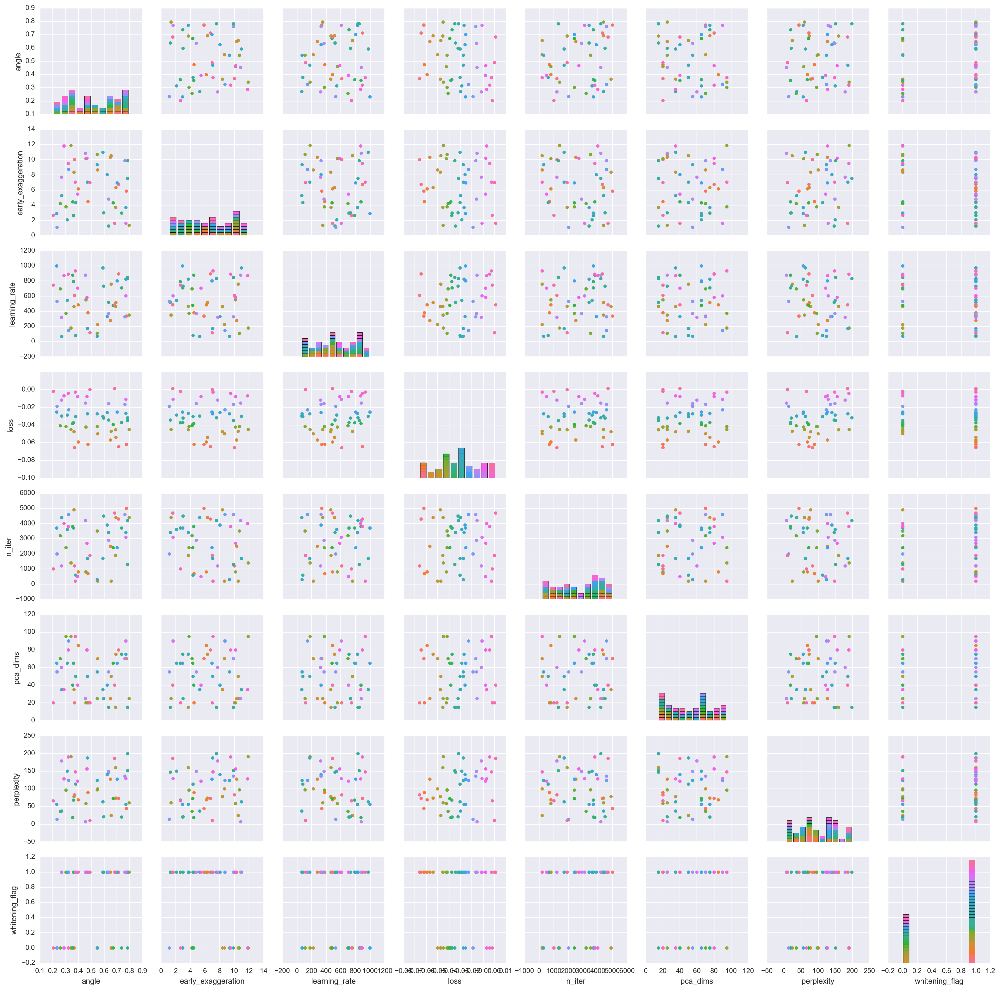

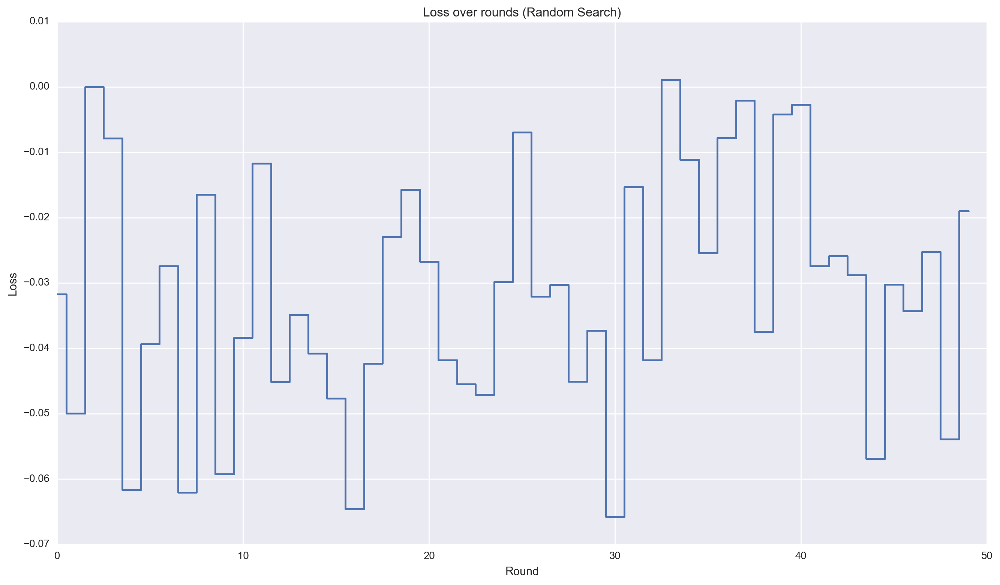

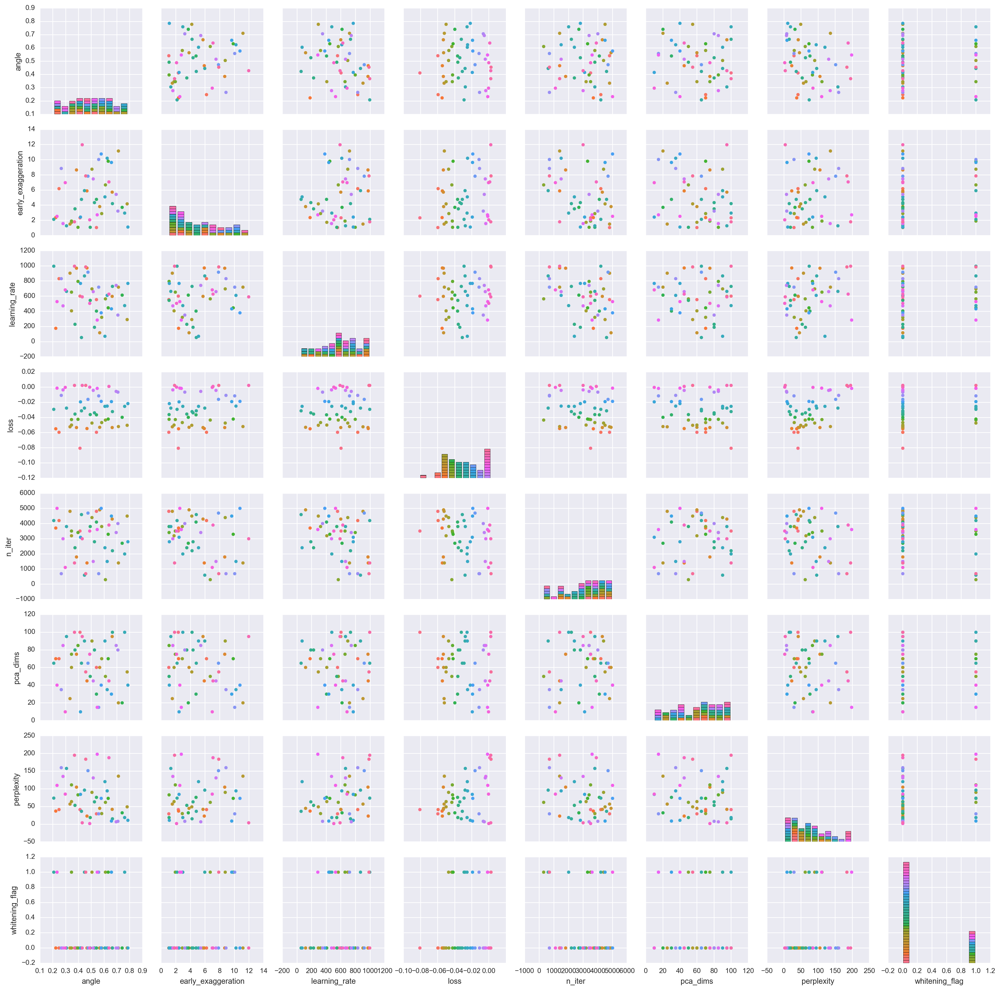

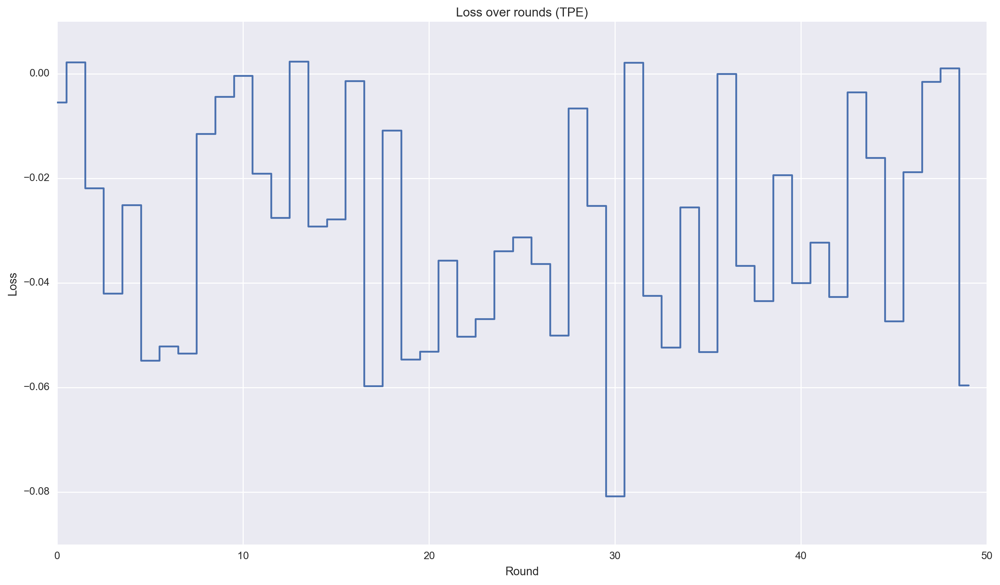

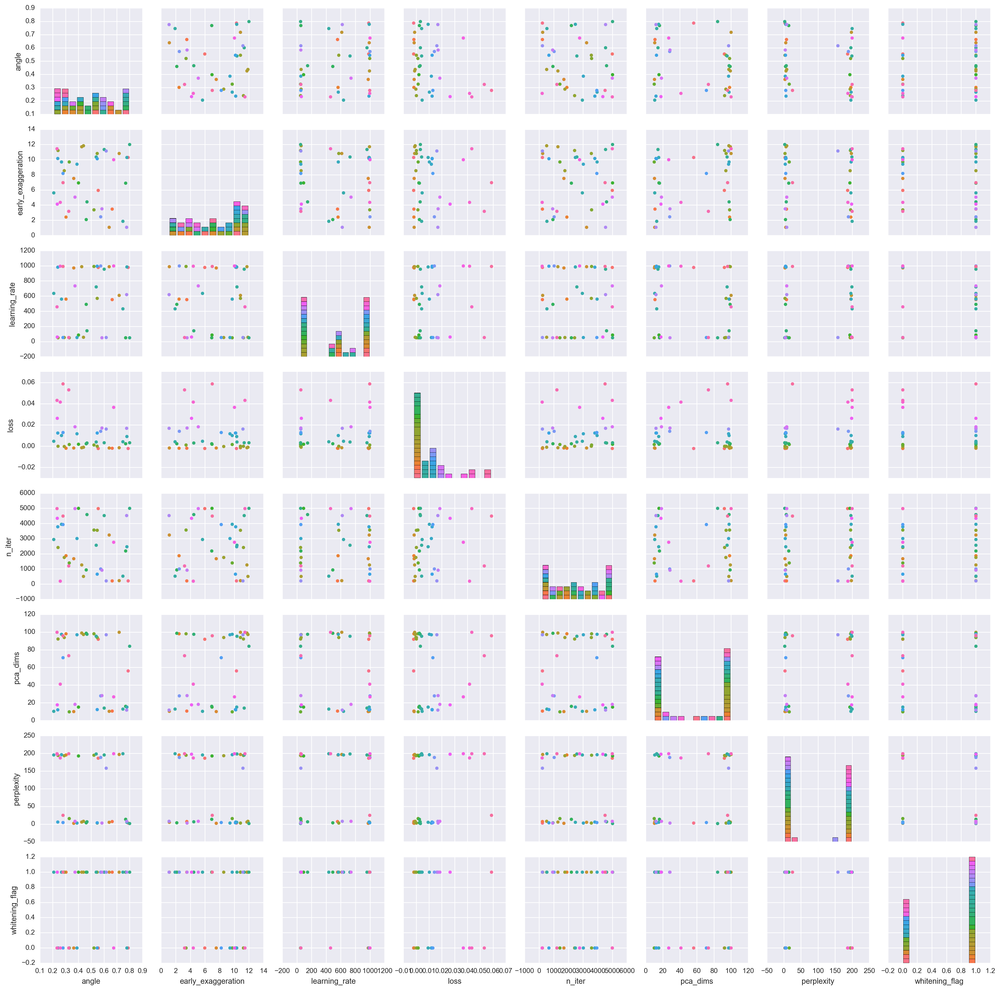

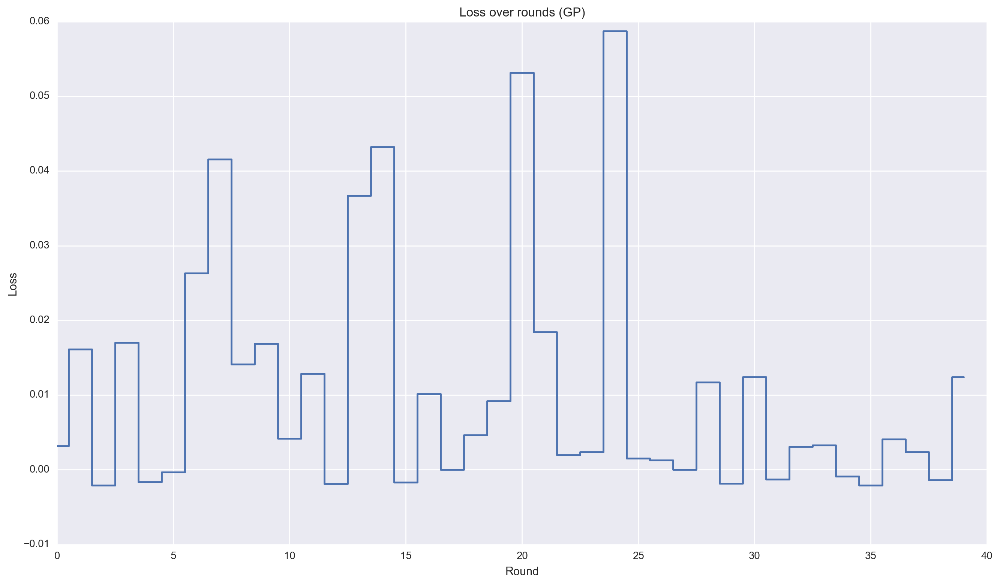

In [39]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = exp_dict['values']
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# random search #

# results data frame
rand_res_df = exp_dict_to_df_hp(experiment_dict['topology']['rand'])

# plotting hyperparameter importance
g = sns.PairGrid(rand_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/topology_rand.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(rand_res_df['loss'])), rand_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (Random Search)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/topology_rand.pdf');

# tpe #

# results data frame
tpe_res_df = exp_dict_to_df_hp(experiment_dict['topology']['tpe'])

# plotting hyperparameter importance
g = sns.PairGrid(tpe_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/topology_tpe.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(tpe_res_df['loss'])), tpe_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (TPE)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/topology_tpe.pdf');

# gaussian processes #

# results data frame
gp_res_df = exp_dict_to_df_bo(experiment_dict['topology']['gp'])

# plotting hyperparameter importance
g = sns.PairGrid(gp_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/topology_gp.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(gp_res_df['loss'])), gp_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (GP)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/topology_gp.pdf');

In [40]:
# showing best embedded spaces #
print "Random Search best:", [i for i,e in enumerate(experiment_dict['topology']['rand']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['topology']['rand']])]
print "TPE best:", [i for i,e in enumerate(experiment_dict['topology']['tpe']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['topology']['tpe']])]
print "GP best:", [i for i,e in enumerate(experiment_dict['topology']['gp']['values']) if e == np.max(experiment_dict['topology']['gp']['values'])]

Random Search best: [30]
TPE best: [30]
GP best: [24]


### 4.5 COIL-20

Images of rotated objects.

In [41]:
# reading the data
test_df = pd.read_csv('data/final/coil-20.csv')

In [42]:
# removing target variable
test_target = test_df['TARGET']

In [43]:
# random search #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/coil_20_rand')

# trials object stores the evaluations
trials_rand = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=rand.suggest, space=space_hp, max_evals=50, trials=trials_rand)

# storing the results
experiment_dict['coil_20']['rand'] = [trials_rand.trials[i]['result'] for i in range(len(trials_rand.trials))]

KL divergence: 0.463850349188 | AMI score: 0.696703622054
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.666665365166
Rank-order correlation: 0.348629313074
Parameters: {'whitening_flag': False, 'n_iter': 2500, 'pca_dims': 80, 'angle': 0.3819158148175464, 'learning_rate': 203.73272171509595, 'early_exaggeration': 11.493160418165276, 'perplexity': 190.0}
 
KL divergence: 0.921831607819 | AMI score: 0.743030200825
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.732621031206
Rank-order correlation: 0.0284267173156
Parameters: {'whitening_flag': False, 'n_iter': 4000, 'pca_dims': 30, 'angle': 0.3462276565250936, 'learning_rate': 418.79900231140385, 'early_exaggeration': 1.7218729247332671, 'perplexity': 32.0}
 
KL divergence: 0.445826113224 | AMI score: 0.792142715839
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.761161883423
Rank-order correlation: 0.346122190567
Parameters: {'whitening_flag': False, 'n_iter': 3700, 'pca_dims': 95, 'angle': 0.7860583648511259, 'learni

In [44]:
# TPE #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/coil_20_tpe')

# trials object stores the evaluations
trials_tpe = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=tpe.suggest, space=space_hp, max_evals=50, trials=trials_tpe)

# storing the results
experiment_dict['coil_20']['tpe'] = [trials_tpe.trials[i]['result'] for i in range(len(trials_tpe.trials))]

KL divergence: 0.475544214249 | AMI score: 0.788051609065
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.773535735228
Rank-order correlation: -0.0378474200696
Parameters: {'whitening_flag': True, 'n_iter': 4800, 'pca_dims': 45, 'angle': 0.6810912268213871, 'learning_rate': 466.0223940799435, 'early_exaggeration': 2.4375663196917117, 'perplexity': 131.0}
 
KL divergence: 0.620209395885 | AMI score: 0.726552062557
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.698825772487
Rank-order correlation: 0.241278885723
Parameters: {'whitening_flag': False, 'n_iter': 800, 'pca_dims': 75, 'angle': 0.4328257302338054, 'learning_rate': 202.25271754988762, 'early_exaggeration': 11.776902592214478, 'perplexity': 112.0}
 
KL divergence: 0.480040282011 | AMI score: 0.782013183287
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.747727183105
Rank-order correlation: 0.0347578347578
Parameters: {'whitening_flag': True, 'n_iter': 1100, 'pca_dims': 40, 'angle': 0.28856187780423437, 'learni

In [45]:
# gaussian processes #

# initializing wrapper - BayesianOptimazion
opt_task_bo = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/coil_20_gp')

# defining optimization object
bo = BayesianOptimization(opt_task_bo.target, space_bo, verbose=0)

# optimizing
bo.maximize(init_points=10, n_iter=40, acq='ucb', kappa=10)

# writing results
experiment_dict['coil_20']['gp'] = bo.res['all']

KL divergence: 0.919425368309 | AMI score: 0.729903786017
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.718761608456
Rank-order correlation: 0.080215257993
Parameters: {'whitening_flag': True, 'n_iter': 3116, 'pca_dims': 43, 'angle': 0.45855971728433154, 'learning_rate': 430.79467099756573, 'early_exaggeration': 10.94882318152704, 'perplexity': 32.902906855199454}
 
KL divergence: 0.287554293871 | AMI score: 0.772766513088
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.732863552545
Rank-order correlation: 0.224184868629
Parameters: {'whitening_flag': False, 'n_iter': 4576, 'pca_dims': 32, 'angle': 0.21627538062262375, 'learning_rate': 759.69132684477108, 'early_exaggeration': 5.5481803264257437, 'perplexity': 188.03972165052284}
 
KL divergence: 0.753557264805 | AMI score: 0.666263036364
AMI target-highd: 0.894875869955 | AMI target-lowd: 0.640993285248
Rank-order correlation: 0.00011396011396
Parameters: {'whitening_flag': True, 'n_iter': 2130, 'pca_dims': 83, 'angle': 

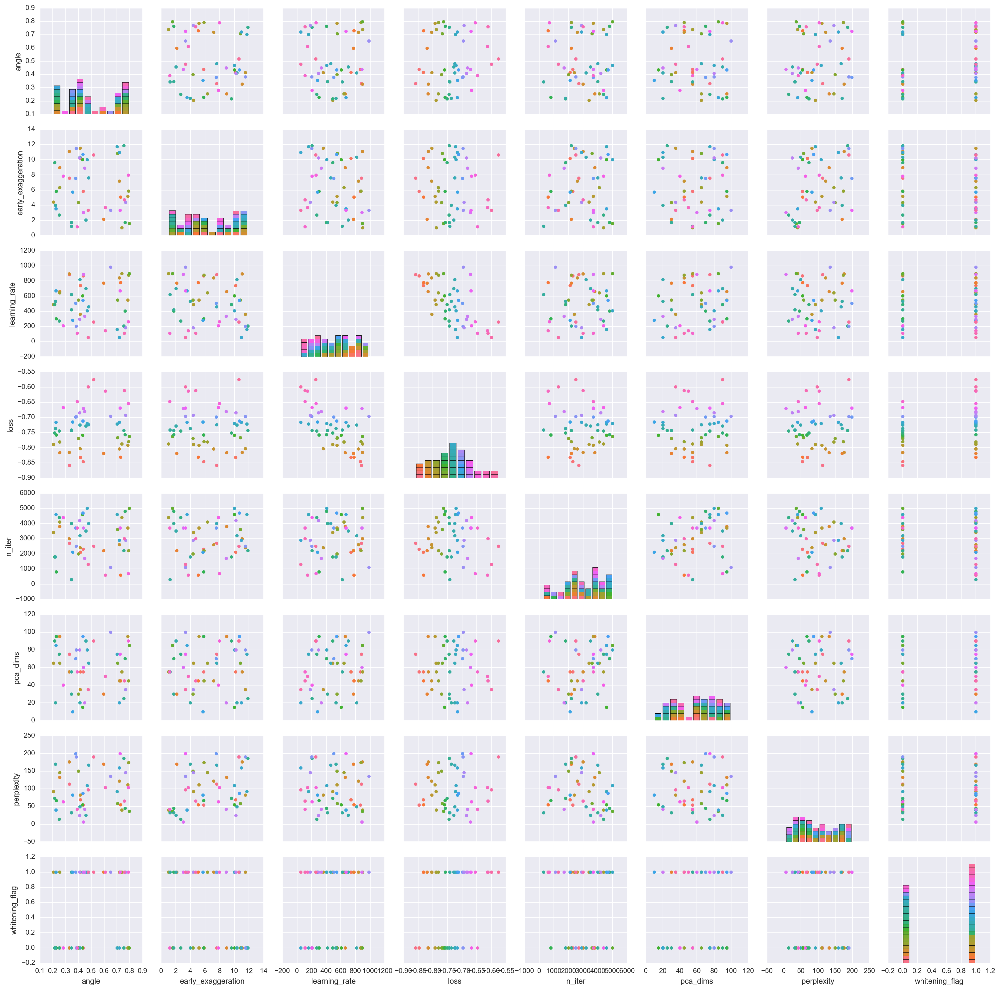

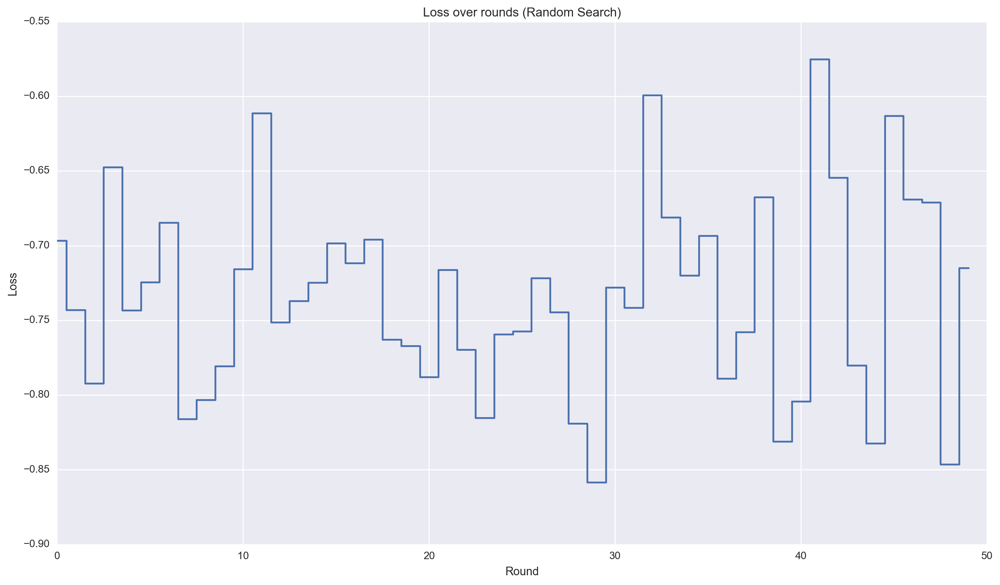

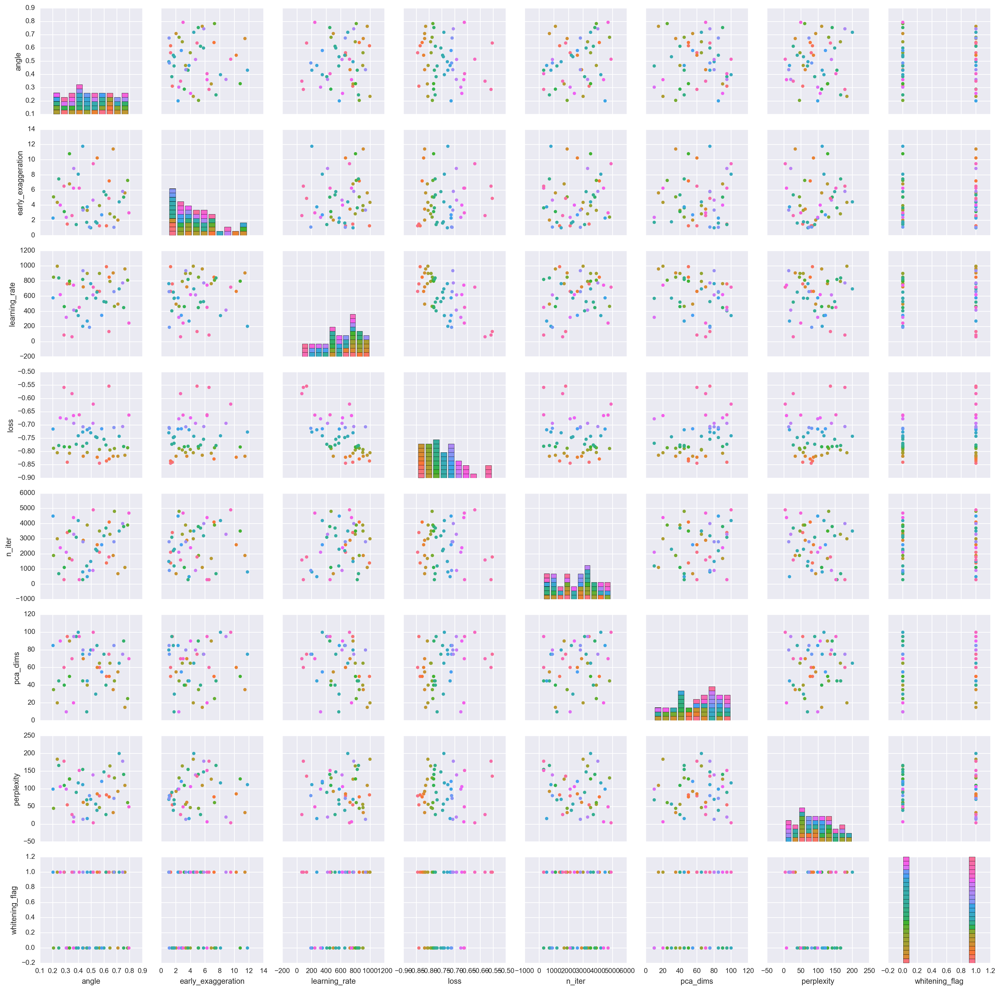

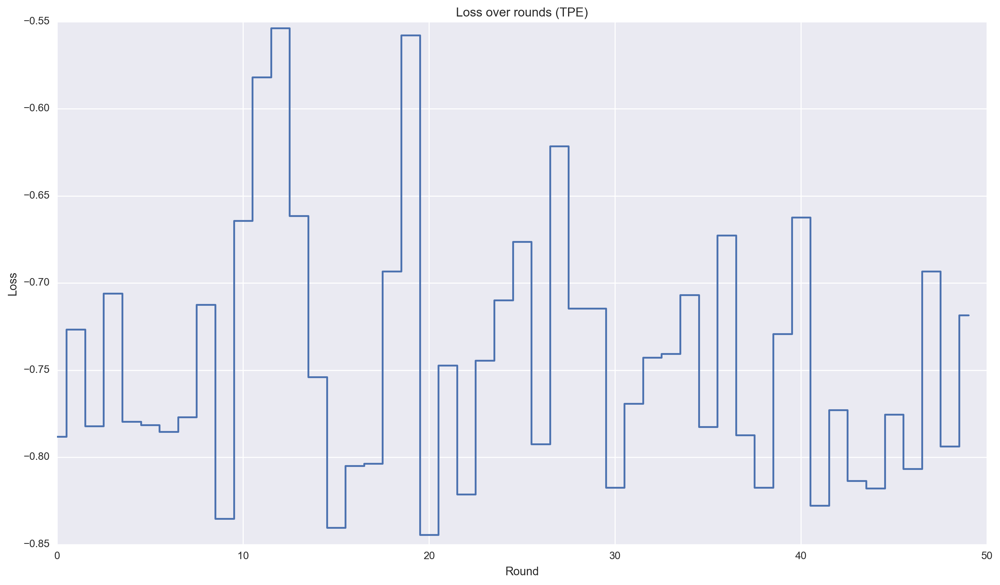

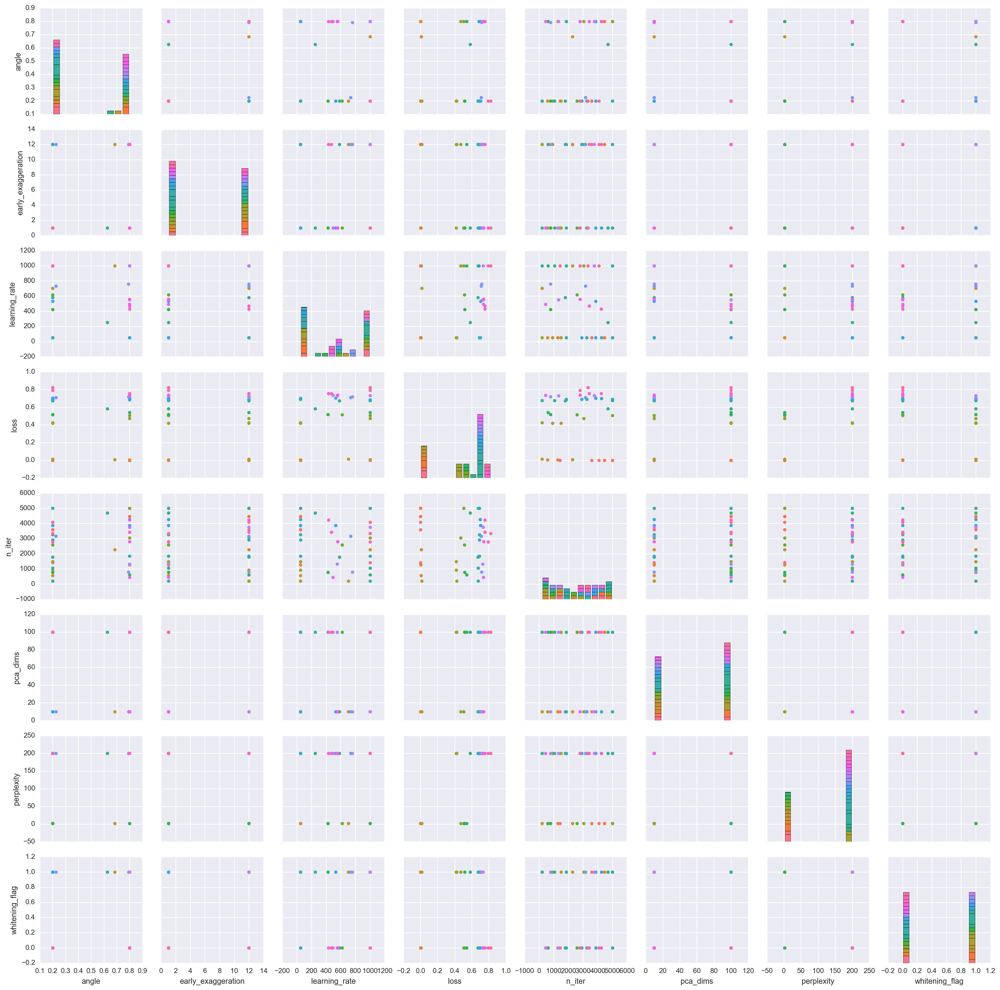

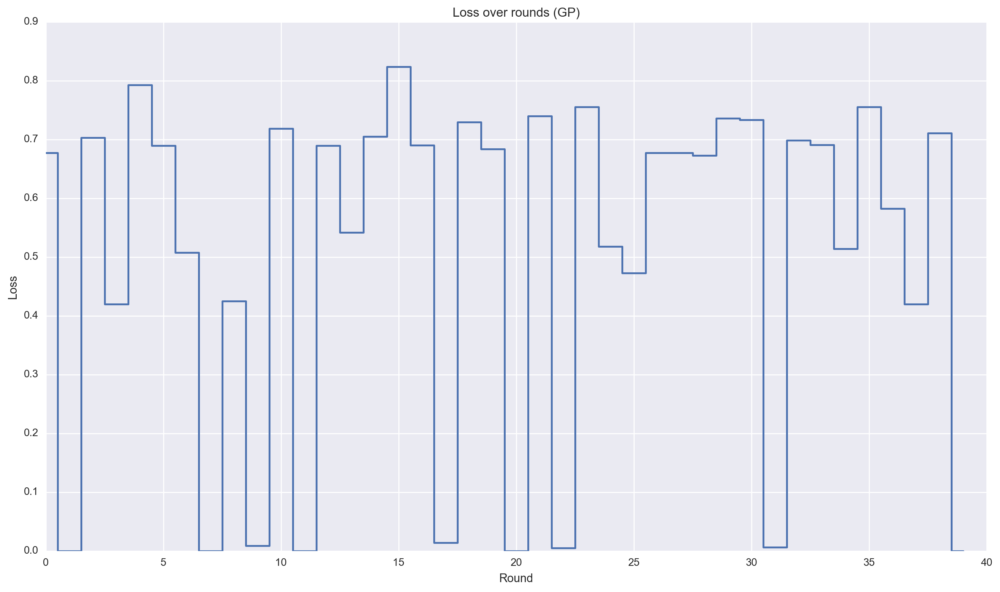

In [46]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = exp_dict['values']
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# random search #

# results data frame
rand_res_df = exp_dict_to_df_hp(experiment_dict['coil_20']['rand'])

# plotting hyperparameter importance
g = sns.PairGrid(rand_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/coil_20_rand.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(rand_res_df['loss'])), rand_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (Random Search)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/coil_20_rand.pdf');

# tpe #

# results data frame
tpe_res_df = exp_dict_to_df_hp(experiment_dict['coil_20']['tpe'])

# plotting hyperparameter importance
g = sns.PairGrid(tpe_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/coil_20_tpe.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(tpe_res_df['loss'])), tpe_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (TPE)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/coil_20_tpe.pdf');

# gaussian processes #

# results data frame
gp_res_df = exp_dict_to_df_bo(experiment_dict['coil_20']['gp'])

# plotting hyperparameter importance
g = sns.PairGrid(gp_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/coil_20_gp.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(gp_res_df['loss'])), gp_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (GP)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/coil_20_gp.pdf');

In [47]:
# showing best embedded spaces #
print "Random Search best:", [i for i,e in enumerate(experiment_dict['coil_20']['rand']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['coil_20']['rand']])]
print "TPE best:", [i for i,e in enumerate(experiment_dict['coil_20']['tpe']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['coil_20']['tpe']])]
print "GP best:", [i for i,e in enumerate(experiment_dict['coil_20']['gp']['values']) if e == np.max(experiment_dict['coil_20']['gp']['values'])]

Random Search best: [29]
TPE best: [20]
GP best: [15]


### 4.6 Olivetti faces

Pictures of different people with small variations.

In [48]:
# reading the data
test_df = pd.read_csv('data/final/olivetti-faces.csv')

In [49]:
# removing target variable
test_target = test_df['TARGET']

In [50]:
# random search #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/olivetti_rand')

# trials object stores the evaluations
trials_rand = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=rand.suggest, space=space_hp, max_evals=50, trials=trials_rand)

# storing the results
experiment_dict['olivetti']['rand'] = [trials_rand.trials[i]['result'] for i in range(len(trials_rand.trials))]

KL divergence: 0.517115592957 | AMI score: 0.259265380943
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0147837278819
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 3500, 'pca_dims': 100, 'angle': 0.5162484538471821, 'learning_rate': 618.5742204018164, 'early_exaggeration': 10.378713096816488, 'perplexity': 43.0}
 
KL divergence: 0.460413962603 | AMI score: 0.0502080076924
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0213418864279
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 3600, 'pca_dims': 25, 'angle': 0.7344398714038269, 'learning_rate': 800.7961151638285, 'early_exaggeration': 11.789945724667252, 'perplexity': 195.0}
 
KL divergence: 1.0922203064 | AMI score: 0.00109913983785
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0128891858188
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 3600, 'pca_dims': 70, 'angle': 0.7809776039497835, 'learning_rate': 74.60946523487578

In [51]:
# TPE #

# initializing wrapper - hyperopt
opt_task_hp = hp_wrapper(test_df, save_path='vis/ami_optim2/all_plots/olivetti_tpe')

# trials object stores the evaluations
trials_tpe = Trials()

# using the fmin function from hyperopt
best = fmin(fn=opt_task_hp.target, algo=tpe.suggest, space=space_hp, max_evals=50, trials=trials_tpe)

# storing the results
experiment_dict['olivetti']['tpe'] = [trials_tpe.trials[i]['result'] for i in range(len(trials_tpe.trials))]

KL divergence: 0.572178721428 | AMI score: -8.31034906824e-16
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 1600, 'pca_dims': 10, 'angle': 0.48794189152986567, 'learning_rate': 508.2734180382184, 'early_exaggeration': 6.633062596493832, 'perplexity': 67.0}
 
KL divergence: 0.38285702467 | AMI score: 0.500985323112
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0140069638804
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 4500, 'pca_dims': 85, 'angle': 0.43508031618599285, 'learning_rate': 580.8107232478521, 'early_exaggeration': 3.448646311098931, 'perplexity': 88.0}
 
KL divergence: 0.469746232033 | AMI score: 0.518556263784
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0323124520478
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 300, 'pca_dims': 65, 'angle': 0.3857880037650743, 'learning_rate': 748.7749778427216, 'early_exa

In [52]:
# gaussian processes #

# initializing wrapper - BayesianOptimazion
opt_task_bo = bo_wrapper(test_df, save_path='vis/ami_optim2/all_plots/olivetti_gp')

# defining optimization object
bo = BayesianOptimization(opt_task_bo.target, space_bo, verbose=0)

# optimizing
bo.maximize(init_points=10, n_iter=40, acq='ucb', kappa=10)

# writing results
experiment_dict['olivetti']['gp'] = bo.res['all']

KL divergence: 0.840845346451 | AMI score: 0.0947455056014
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0104801100471
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 3392, 'pca_dims': 60, 'angle': 0.5470104920355463, 'learning_rate': 920.75303371629934, 'early_exaggeration': 5.6593528577285976, 'perplexity': 22.770919042019628}
 
KL divergence: 0.291583925486 | AMI score: 0.49241522735
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.0329585164974
Rank-order correlation: -1.0
Parameters: {'whitening_flag': False, 'n_iter': 2401, 'pca_dims': 39, 'angle': 0.61012836596132003, 'learning_rate': 564.77626747253157, 'early_exaggeration': 5.6864141949236284, 'perplexity': 134.21597488388946}
 
KL divergence: 0.394101172686 | AMI score: 0.166317957298
AMI target-highd: 0.0287380980521 | AMI target-lowd: 0.025961264114
Rank-order correlation: -1.0
Parameters: {'whitening_flag': True, 'n_iter': 3396, 'pca_dims': 47, 'angle': 0.57991324377038556, 'learn

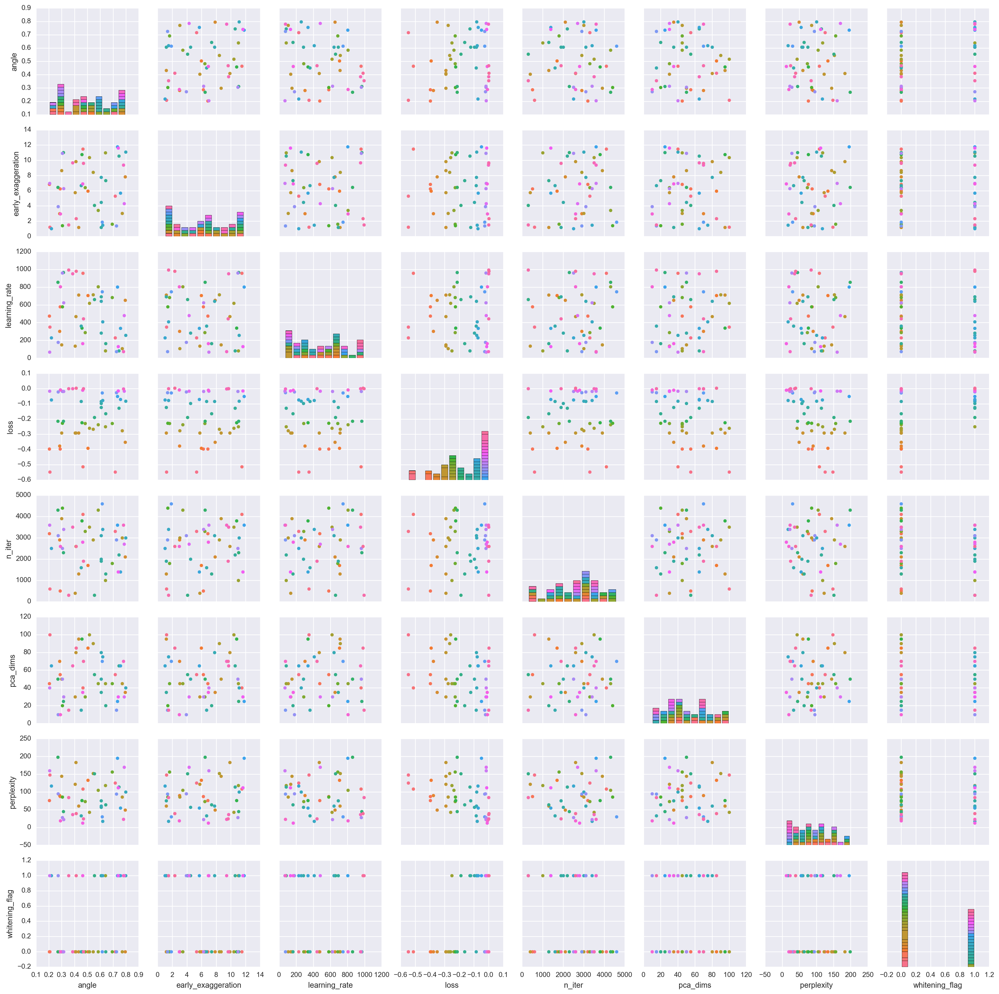

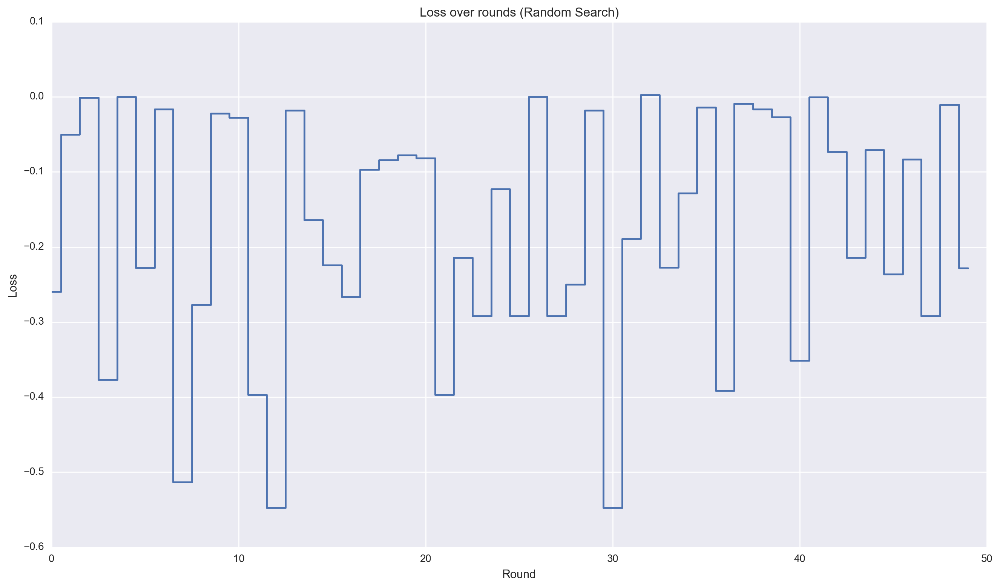

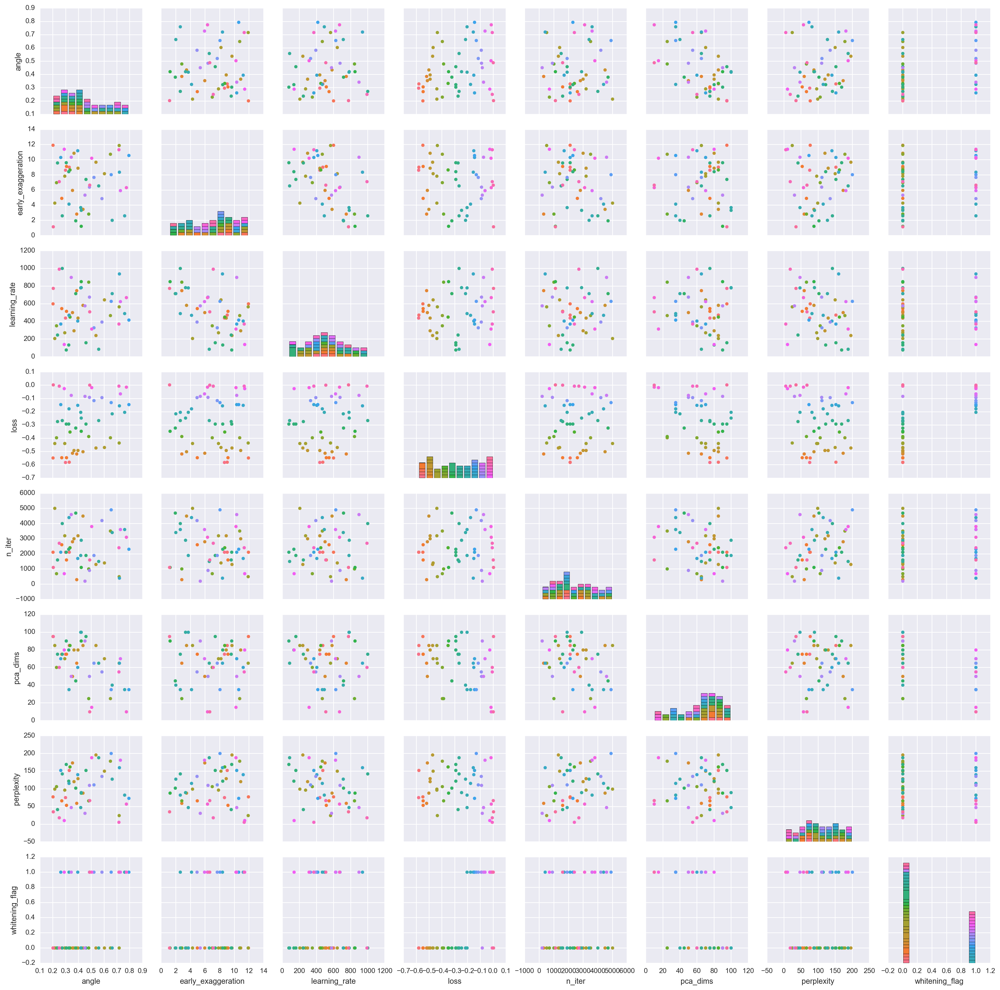

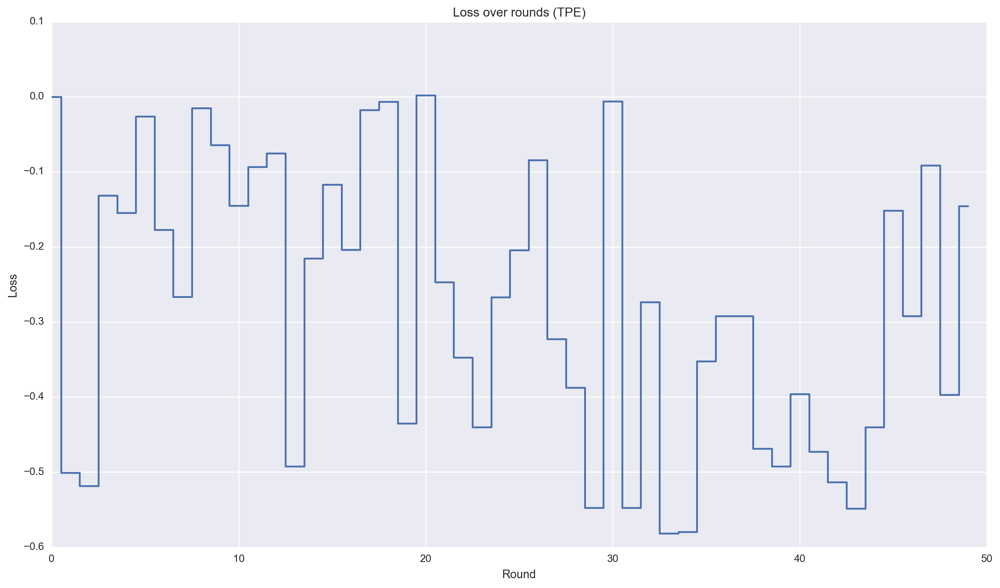

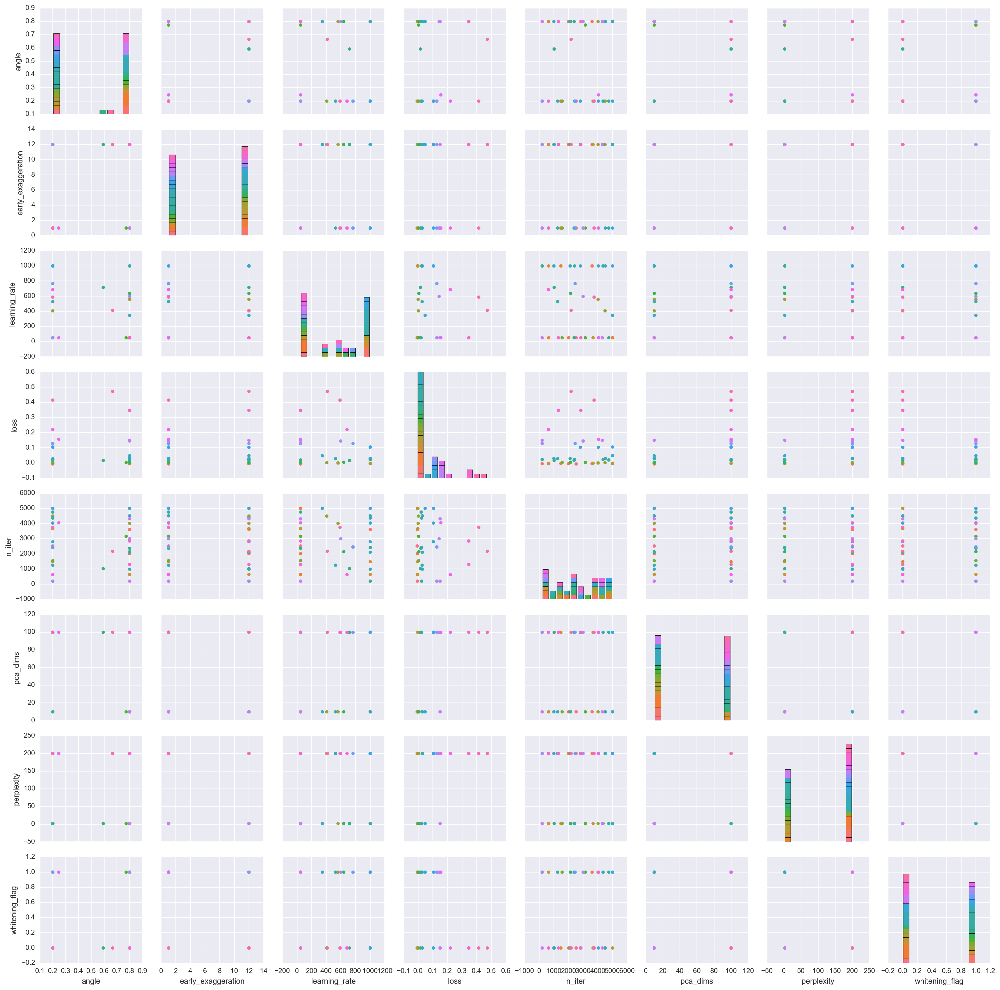

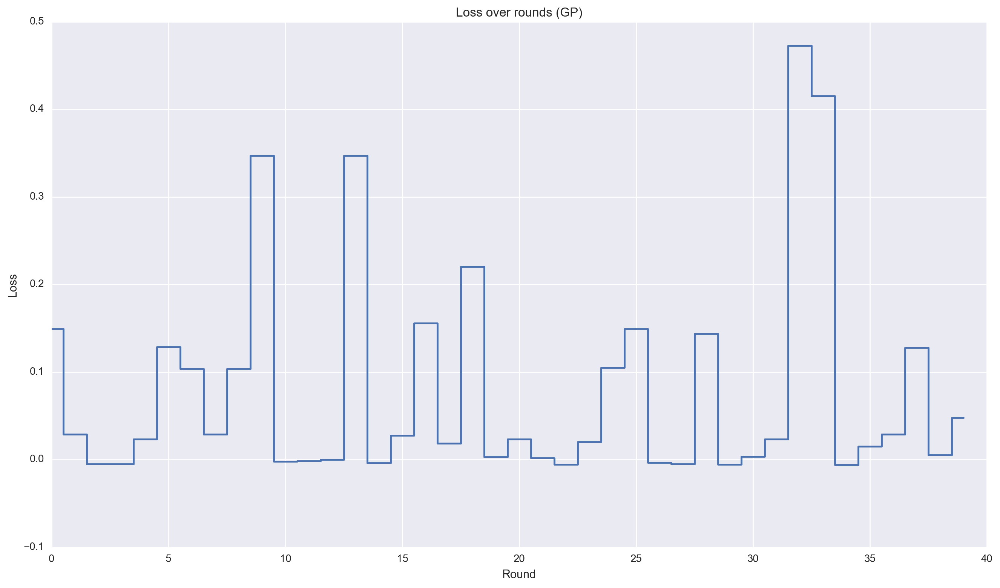

In [53]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = exp_dict['values']
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# random search #

# results data frame
rand_res_df = exp_dict_to_df_hp(experiment_dict['olivetti']['rand'])

# plotting hyperparameter importance
g = sns.PairGrid(rand_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/olivetti_rand.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(rand_res_df['loss'])), rand_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (Random Search)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/olivetti_rand.pdf');

# tpe #

# results data frame
tpe_res_df = exp_dict_to_df_hp(experiment_dict['olivetti']['tpe'])

# plotting hyperparameter importance
g = sns.PairGrid(tpe_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/olivetti_tpe.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(tpe_res_df['loss'])), tpe_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (TPE)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/olivetti_tpe.pdf');

# gaussian processes #

# results data frame
gp_res_df = exp_dict_to_df_bo(experiment_dict['olivetti']['gp'])

# plotting hyperparameter importance
g = sns.PairGrid(gp_res_df, hue='loss');
g.map_diag(plt.hist);
g.map_offdiag(plt.scatter);
g.savefig('vis/ami_optim2/hyperparam_maps/olivetti_gp.pdf');

# plotting loss function evolution
fig = plt.figure(figsize=[16,9]); plt.step(range(len(gp_res_df['loss'])), gp_res_df['loss'], where='mid'); 
plt.title('Loss over rounds (GP)'); plt.xlabel('Round'); plt.ylabel('Loss'); 
fig.savefig('vis/ami_optim2/loss_over_rounds/olivetti_gp.pdf');

In [54]:
# showing best embedded spaces #
print "Random Search best:", [i for i,e in enumerate(experiment_dict['olivetti']['rand']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['olivetti']['rand']])]
print "TPE best:", [i for i,e in enumerate(experiment_dict['olivetti']['tpe']) if e['loss'] == np.min([e['loss'] for e in experiment_dict['olivetti']['tpe']])]
print "GP best:", [i for i,e in enumerate(experiment_dict['olivetti']['gp']['values']) if e == np.max(experiment_dict['olivetti']['gp']['values'])]

Random Search best: [12, 30]
TPE best: [33]
GP best: [32]


## Final Data & Plots

Let us wrap the data up for publication, with includes the generation of new plots.

In [68]:
# computing figures of the optimization process #

# function to transform the experiment dict into a data frame - hyperopt #
def exp_dict_to_df_hp(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict:

        # add parameters to dict
        for key in dict_entry['parameters'].keys():
            try:
                temp_dict[key].append(dict_entry['parameters'][key])
            except KeyError:
                temp_dict[key] = [dict_entry['parameters'][key]]

        # add loss to dict
        try:
            temp_dict['loss'].append(-1.0*dict_entry['loss'])
        except KeyError:
            temp_dict['loss'] = [-1.0*dict_entry['loss']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

# function to transform the experiment dict into a data frame - bayesian optim #
def exp_dict_to_df_bo(exp_dict):

    # dictionary to story intermediate values
    temp_dict = dict()

    # for each experiment
    for dict_entry in exp_dict['params']:

        # add parameters to dict
        for key in dict_entry.keys():
            try:
                temp_dict[key].append(dict_entry[key])
            except KeyError:
                temp_dict[key] = [dict_entry[key]]
    
    # adding loss
    temp_dict['loss'] = np.array(exp_dict['values'])
    
    # correcting whitening_flag
    temp_dict['whitening_flag'] = [False if e < 0.50 else True for e in temp_dict['whitening_flag']]
    
    # return a data frame
    return pd.DataFrame(temp_dict)

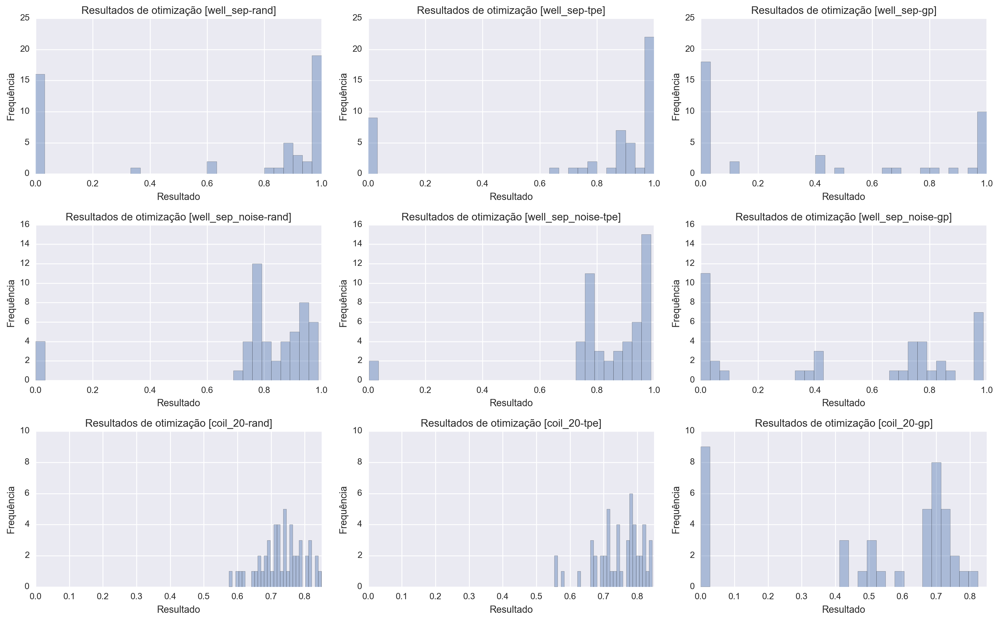

In [86]:
# opening figure
fig = plt.figure(figsize=[16,10], dpi=300)

# count variable
count = 0

# x-axis limits
x_limits = {'well_sep': [0.0,1.0], 'well_sep_noise': [0.0,1.0], 'coil_20': [0.0, 0.85]}
y_limits = {'well_sep': [0.0,25.0], 'well_sep_noise': [0.0,16.0], 'coil_20': [0.0, 10.0]}

# realizing joined graphs
for dataset in ['well_sep', 'well_sep_noise', 'coil_20']:
        
    for optim in ['rand', 'tpe', 'gp']:
        
        # choosing right function 
        if optim == 'gp':

            # results data frame
            res_df = exp_dict_to_df_bo(experiment_dict[dataset][optim])            
            
        # if not gp, use hp data treting function
        else:
            
            # results data frame
            res_df = exp_dict_to_df_hp(experiment_dict[dataset][optim])

        # plotting loss function evolution
        plt.subplot(3, 3, count + 1); sns.distplot(res_df.loc[res_df['loss'] < 100,'loss'], label=optim, bins=30, kde=False); plt.tight_layout()
        plt.title(u'Resultados de otimização [{}-{}]'.format(dataset, optim)); plt.xlabel('Resultado'); plt.ylabel(u'Frequência'); 
        plt.xlim(x_limits[dataset]); plt.ylim(y_limits[dataset])
        
        # adding to count
        count += 1

In [87]:
fig.savefig('vis/ami_optim2/loss_over_rounds/ami-loss-histo.pdf');

In [71]:
# max, min, mean per optimization round table
summary_df = pd.DataFrame()

# realizing joined graphs
for dataset in ['well_sep', 'well_sep_noise', 'coil_20']:
        
    for optim in ['rand', 'tpe', 'gp']:
        
        # choosing right function 
        if optim == 'gp':

            # results data frame
            res_df = exp_dict_to_df_bo(experiment_dict[dataset][optim])            
            
        # if not gp, use hp data treting function
        else:
            
            # results data frame
            res_df = exp_dict_to_df_hp(experiment_dict[dataset][optim])

        # temporary df
        temp_df = pd.DataFrame()
        temp_df.loc[:,'dataset'] = [dataset]
        temp_df.loc[:,'optim'] = [optim]
        temp_df.loc[:,'mean_loss'] = [res_df['loss'].mean()]
        temp_df.loc[:,'max_loss'] = [res_df['loss'].max()]
        temp_df.loc[:,'min_loss'] = [res_df['loss'].min()]
        
        # accumulating
        summary_df = pd.concat([summary_df, temp_df])

In [74]:
summary_df

,dataset,optim,mean_loss,max_loss,min_loss
0,well_sep,rand,0.628055,1.000000,-1.554197e-03
0,well_sep,tpe,0.764075,1.000000,-1.077327e-03
0,well_sep,gp,0.423185,1.000000,6.778406e-04
0,well_sep_noise,rand,0.786561,0.988115,4.048088e-04
0,well_sep_noise,tpe,0.847412,0.988115,3.484111e-03
0,well_sep_noise,gp,0.498063,0.988115,2.432531e-17
0,coil_20,rand,0.734528,0.858499,5.750729e-01
0,coil_20,tpe,0.744464,0.844431,5.536224e-01
0,coil_20,gp,0.504571,0.823488,0.000000e+00


In [88]:
# finding the distributions of parameters for the best experiments #

# opening figure
f = plt.figure(figsize=[9,9], dpi=300)

# accummulation dict
top5_dict = {}

# realizing joined graphs
for i, dataset in enumerate(['well_sep', 'well_sep_noise', 'coil_20']):
    
    # df for storing all the best experiments
    dataset_res_df = pd.DataFrame()
        
    for optim in ['rand', 'tpe', 'gp']:
        
        # choosing right function 
        if optim == 'gp':

            # results data frame
            res_df = exp_dict_to_df_bo(experiment_dict[dataset][optim]); res_df.loc[:,'optim'] = optim            
            
        # if not gp, use hp data treting function
        else:
            
            # results data frame
            res_df = exp_dict_to_df_hp(experiment_dict[dataset][optim]); res_df.loc[:,'optim'] = optim 
        
        # updating 
        dataset_res_df = pd.concat([dataset_res_df, res_df])
    
    # filtering top 5 trials
    top5 = dataset_res_df.sort_values('loss', ascending=False).head(5)
    top5.loc[:,'whitening_flag'] = top5.loc[:,'whitening_flag'].astype(str)
    
    # accumulating
    top5_dict[dataset] = top5.loc[:, ['loss','angle','early_exaggeration','learning_rate','n_iter','pca_dims','perplexity','whitening_flag','optim']]

In [89]:
top5_dict['well_sep']

,loss,angle,early_exaggeration,learning_rate,n_iter,pca_dims,perplexity,whitening_flag,optim
20,1.0,0.761762,5.641831,69.606481,2000.000000,40.0,199.0,False,tpe
17,1.0,0.379202,7.706639,561.783864,4300.000000,75.0,162.0,False,tpe
38,1.0,0.700830,2.888514,267.710482,400.000000,90.0,14.0,False,rand
40,1.0,0.796923,8.158700,366.308370,2000.000000,60.0,68.0,False,rand
13,1.0,0.800000,1.000000,1000.000000,1934.381142,10.0,200.0,True,gp


In [90]:
top5_dict['well_sep_noise']

,loss,angle,early_exaggeration,learning_rate,n_iter,pca_dims,perplexity,whitening_flag,optim
11,0.988115,0.800000,1.000000,50.000000,841.638521,10.0,200.0,False,gp
36,0.988115,0.481097,7.497102,979.220591,3600.000000,45.0,38.0,False,tpe
43,0.988115,0.480456,6.074751,186.562338,3900.000000,60.0,36.0,False,tpe
30,0.988115,0.800000,12.000000,50.000000,2363.164039,10.0,200.0,False,gp
29,0.988115,0.800000,12.000000,50.000000,3832.937012,10.0,200.0,True,gp


In [93]:
top5_dict['coil_20']

,loss,angle,early_exaggeration,learning_rate,n_iter,pca_dims,perplexity,whitening_flag,optim
29,0.858499,0.329876,7.574342,882.679277,2700.0,75.0,113.0,False,rand
48,0.846423,0.437726,5.823949,867.475877,2300.0,55.0,54.0,False,rand
20,0.844431,0.564353,1.294559,661.882926,2100.0,60.0,80.0,True,tpe
15,0.840320,0.312728,1.512333,762.170580,3400.0,95.0,55.0,False,tpe
9,0.835260,0.617249,1.277097,990.521001,1400.0,50.0,83.0,True,tpe


In [73]:
# função para salvar dicionário de experimentos
import pickle
def save_obj(obj, name):
    with open(name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, 0)
        
# salvando dicionário de resultados
save_obj(experiment_dict, 'trials/ami')

In [ ]:
def load_obj(name ):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)